In [15]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import time
import heapq
from collections import deque
import warnings
warnings.filterwarnings('ignore')

In [16]:
# Set up matplotlib for inline display in Colab
%matplotlib inline

In [17]:
class Environment:
    """Enhanced environment with metrics tracking"""
    def __init__(self, width=60, height=60):
        self.width = width
        self.height = height
        self.grid = np.zeros((height, width), dtype=np.int8)
        self.doors = []
        self.buildings = []
        self.obstacles = []

    def add_obstacle(self, x, y, width, height, name=""):
        """Add obstacle with name for tracking"""
        y_start, y_end = max(0, y), min(self.height, y + height)
        x_start, x_end = max(0, x), min(self.width, x + width)
        self.grid[y_start:y_end, x_start:x_end] = 1
        self.obstacles.append({
            'name': name or f"Obstacle_{len(self.obstacles)}",
            'position': (x, y),
            'size': (width, height)
        })

    def add_building(self, x, y, width, height, door_positions, name=""):
        """Add building with doors"""
        self.add_obstacle(x, y, width, height, name)
        self.buildings.append({
            'name': name or f"Building_{len(self.buildings)}",
            'position': (x, y),
            'size': (width, height),
            'doors': door_positions
        })

        for door_x, door_y in door_positions:
            y_start, y_end = max(0, door_y), min(self.height, door_y + 2)
            x_start, x_end = max(0, door_x), min(self.width, door_x + 2)
            self.grid[y_start:y_end, x_start:x_end] = 0
            self.doors.append((door_x, door_y))

    def is_free(self, x, y):
        """Check if cell is free"""
        return (0 <= x < self.width and 0 <= y < self.height and
                self.grid[y, x] == 0)

In [18]:
class DeliveryRobot:
    """Robot with comprehensive metrics tracking"""
    def __init__(self, env, start_pos=(5, 5)):
        self.env = env
        self.position = start_pos
        self.path = []
        self.battery = 100
        self.carrying_package = False
        self.delivery_locations = []
        self.navigation_history = [start_pos]
        self.current_package = None
        self.step_count = 0

        # Metrics tracking
        self.metrics = {
            'distance_traveled': 0,
            'battery_used': 0,
            'deliveries_completed': 0,
            'packages_picked': 0,
            'path_replans': 0,
            'obstacles_avoided': 0,
            'charging_sessions': 0,
            'total_time': 0,
            'average_speed': 0,
            'efficiency': 0
        }
        self.start_time = time.time()
        self.last_position = start_pos

    def get_neighbors(self, pos):
        """Get valid neighboring positions"""
        x, y = pos
        neighbors = []
        # 4-direction movement for simpler paths
        for dx, dy in [(0,1),(1,0),(0,-1),(-1,0)]:
            nx, ny = x + dx, y + dy
            if self.env.is_free(nx, ny):
                neighbors.append((nx, ny))
        return neighbors

    def heuristic(self, a, b):
        """Manhattan distance heuristic"""
        return abs(a[0] - b[0]) + abs(a[1] - b[1])

    def plan_path(self, start, goal):
        """A* path planning with metrics"""
        if start == goal:
            return []

        open_set = []
        heapq.heappush(open_set, (0, start))
        came_from = {}
        g_score = {start: 0}
        f_score = {start: self.heuristic(start, goal)}

        while open_set:
            _, current = heapq.heappop(open_set)

            if current == goal:
                # Reconstruct path
                path = []
                while current in came_from:
                    path.append(current)
                    current = came_from[current]
                path.reverse()
                return path

            for neighbor in self.get_neighbors(current):
                tentative_g = g_score[current] + 1

                if neighbor not in g_score or tentative_g < g_score[neighbor]:
                    came_from[neighbor] = current
                    g_score[neighbor] = tentative_g
                    f_score[neighbor] = tentative_g + self.heuristic(neighbor, goal)
                    heapq.heappush(open_set, (f_score[neighbor], neighbor))

        self.metrics['path_replans'] += 1
        return []

    def set_delivery_plan(self, pickup_locations, delivery_locations):
        """Set delivery plan"""
        self.delivery_locations = []
        for i, (pickup, delivery) in enumerate(zip(pickup_locations, delivery_locations)):
            self.delivery_locations.append({
                'type': 'pickup',
                'location': pickup,
                'completed': False,
                'package_id': i+1
            })
            self.delivery_locations.append({
                'type': 'delivery',
                'location': delivery,
                'completed': False,
                'package_id': i+1
            })

    def navigate_to(self, goal):
        """Navigate to goal with metrics tracking"""
        if self.position == goal:
            return True

        # Calculate distance traveled
        if self.last_position != self.position:
            dist = self.heuristic(self.last_position, self.position)
            self.metrics['distance_traveled'] += dist
            self.last_position = self.position

        if not self.path or (self.path and self.path[-1] != goal):
            self.path = self.plan_path(self.position, goal)
            if not self.path:
                return False

        if self.path:
            next_pos = self.path[0]
            if self.env.is_free(*next_pos):
                self.position = next_pos
                self.navigation_history.append(self.position)
                self.path.pop(0)
                self.step_count += 1

                # Update metrics
                self.battery -= 0.2
                self.metrics['battery_used'] += 0.2

                return self.position == goal
            else:
                self.path = self.plan_path(self.position, goal)
                self.metrics['obstacles_avoided'] += 1

        return False

    def complete_task(self, task_type, package_id):
        """Complete a delivery task"""
        if task_type == 'pickup':
            self.carrying_package = True
            self.current_package = package_id
            self.metrics['packages_picked'] += 1
        else:
            self.carrying_package = False
            self.metrics['deliveries_completed'] += 1
            self.current_package = None

    def charge_battery(self):
        """Charge robot battery"""
        self.battery = 100
        self.metrics['charging_sessions'] += 1

    def get_current_metrics(self):
        """Get current metrics"""
        current_time = time.time()
        self.metrics['total_time'] = current_time - self.start_time

        if self.metrics['total_time'] > 0:
            self.metrics['average_speed'] = (
                self.metrics['distance_traveled'] / self.metrics['total_time']
            )

        if self.metrics['total_time'] > 0:
            self.metrics['efficiency'] = (
                self.metrics['deliveries_completed'] / (self.metrics['total_time'] / 60)
            )

        return self.metrics.copy()

In [19]:
class StageByStageVisualization:
    """Visualization that shows EVERY stage without clearing"""
    def __init__(self, env, robot):
        self.env = env
        self.robot = robot
        self.stage_count = 0

    def show_stage(self, stage_name, current_task=None, is_final=False):
        """Show a complete visualization stage"""
        self.stage_count += 1

        # Create new figure for each stage
        fig = plt.figure(figsize=(20, 12))

        if is_final:
            title = f'STAGE {self.stage_count}: {stage_name} - MISSION COMPplete!'
            title_color = 'green'
        else:
            title = f'STAGE {self.stage_count}: {stage_name}'
            title_color = 'blue'

        fig.suptitle(title, fontsize=16, fontweight='bold', color=title_color, y=0.95)

        # Create grid layout
        gs = plt.GridSpec(3, 3, figure=fig)

        # Main map
        ax_main = fig.add_subplot(gs[0:2, 0:2])
        # Metrics
        ax_metrics = fig.add_subplot(gs[0, 2])
        # Progress
        ax_progress = fig.add_subplot(gs[1, 2])
        # Status
        ax_status = fig.add_subplot(gs[2, 0])
        # Path info
        ax_path = fig.add_subplot(gs[2, 1])
        # Task info
        ax_task = fig.add_subplot(gs[2, 2])

        # Plot all components
        self._plot_main_map(ax_main, current_task, stage_name)
        self._plot_metrics(ax_metrics)
        self._plot_progress(ax_progress)
        self._plot_status(ax_status)
        self._plot_path_info(ax_path)
        self._plot_task_info(ax_task, current_task, stage_name)

        plt.tight_layout()
        plt.subplots_adjust(top=0.90)
        plt.show()

        print(f"📸 Displayed: {stage_name}")
        print("=" * 80)

    def _plot_main_map(self, ax, current_task, stage_name):
        """Plot the main environment map"""
        # Background
        ax.imshow(self.env.grid, cmap='Greens', alpha=0.2,
                 extent=[0, self.env.width, 0, self.env.height])

        # Buildings
        for building in self.env.buildings:
            x, y = building['position']
            w, h = building['size']
            rect = patches.Rectangle((x, y), w, h, linewidth=2,
                                   edgecolor='navy', facecolor='lightblue', alpha=0.7)
            ax.add_patch(rect)
            ax.text(x + w/2, y + h/2, building['name'],
                   ha='center', va='center', fontsize=8, fontweight='bold')

        # Obstacles
        for obstacle in self.env.obstacles:
            x, y = obstacle['position']
            w, h = obstacle['size']
            rect = patches.Rectangle((x, y), w, h, linewidth=1,
                                   edgecolor='darkred', facecolor='lightcoral', alpha=0.7)
            ax.add_patch(rect)

        # Traveled path
        if len(self.robot.navigation_history) > 1:
            hist_x, hist_y = zip(*self.robot.navigation_history)
            ax.plot(hist_x, hist_y, 'b-', alpha=0.6, linewidth=2, label='Traveled Path')

        # Current path
        if self.robot.path and len(self.robot.path) > 0:
            path_x, path_y = zip(*self.robot.path)
            ax.plot(path_x, path_y, 'r--', linewidth=2, alpha=0.8, label='Planned Path')

        # Delivery locations
        for task in self.robot.delivery_locations:
            x, y = task['location']
            color = 'orange' if task['type'] == 'pickup' else 'purple'
            marker = 's' if task['type'] == 'pickup' else 'D'
            size = 80 if not task['completed'] else 40
            alpha = 1.0 if not task['completed'] else 0.4

            if current_task and task == current_task:
                # Highlight current task
                ax.plot(x, y, marker=marker, color=color, markersize=10,
                       alpha=1.0, markeredgecolor='gold', markeredgewidth=3)
                ax.text(x, y + 3, 'CURRENT', ha='center', va='bottom',
                       fontsize=9, fontweight='bold', color='red')
            else:
                ax.plot(x, y, marker=marker, color=color, markersize=8, alpha=alpha)

            status = "✓" if task['completed'] else f"Pkg{task['package_id']}"
            ax.text(x, y - 2, status, ha='center', va='top', fontsize=8, fontweight='bold')

        # Robot
        robot_x, robot_y = self.robot.position
        robot_color = 'red' if not self.robot.carrying_package else 'darkorange'

        ax.plot(robot_x, robot_y, 'o', color=robot_color, markersize=15,
               label='Robot', markeredgecolor='black', markeredgewidth=2)

        if self.robot.carrying_package:
            ax.text(robot_x, robot_y - 3, f'Pkg{self.robot.current_package}',
                   ha='center', va='top', fontsize=9, fontweight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.8))

        ax.set_xlim(0, self.env.width)
        ax.set_ylim(0, self.env.height)
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        ax.set_title(f'{stage_name}', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.2)
        ax.legend(loc='upper right', fontsize=8)

    def _plot_metrics(self, ax):
        """Plot current metrics"""
        metrics = self.robot.get_current_metrics()

        metric_data = [
            ('Total Steps', f"{self.robot.step_count}"),
            ('Distance', f"{metrics['distance_traveled']:.1f}"),
            ('Battery', f"{self.robot.battery:.1f}%"),
            ('Deliveries', f"{metrics['deliveries_completed']}"),
            ('Packages', f"{metrics['packages_picked']}"),
            ('Replans', f"{metrics['path_replans']}"),
            ('Obstacles', f"{metrics['obstacles_avoided']}"),
            ('Charging', f"{metrics['charging_sessions']}"),
            ('Time', f"{metrics['total_time']:.1f}s"),
            ('Speed', f"{metrics['average_speed']:.2f}u/s")
        ]

        table = ax.table(
            cellText=[[name, value] for name, value in metric_data],
            cellLoc='center',
            loc='center',
            bbox=[0, 0, 1, 1]
        )
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        table.scale(1, 1.8)

        ax.set_title('Live Metrics', fontsize=12, fontweight='bold')
        ax.axis('off')

    def _plot_progress(self, ax):
        """Plot delivery progress"""
        tasks = self.robot.delivery_locations
        completed = len([t for t in tasks if t['completed']])
        total = len(tasks)
        progress = (completed / total) * 100 if total > 0 else 0

        ax.barh(['Progress'], [progress], color='lightgreen', edgecolor='darkgreen', height=0.3)
        if progress < 100:
            ax.barh(['Progress'], [100-progress], left=[progress],
                   color='lightcoral', edgecolor='darkred', alpha=0.7, height=0.3)

        ax.set_xlim(0, 100)
        ax.set_xlabel('Completion %')
        ax.set_title('Task Progress', fontweight='bold')
        ax.text(50, 0, f'{completed}/{total}\n{progress:.1f}%',
               ha='center', va='center', fontweight='bold', fontsize=11)
        ax.set_ylim(-0.5, 0.5)

    def _plot_status(self, ax):
        """Plot robot status"""
        ax.axis('off')

        # Battery
        battery_level = self.robot.battery
        battery_color = 'green' if battery_level > 50 else 'orange' if battery_level > 20 else 'red'

        battery_rect = patches.Rectangle((0.1, 0.6), 0.8, 0.3, linewidth=2,
                                       edgecolor='black', facecolor='white')
        ax.add_patch(battery_rect)
        battery_fill = patches.Rectangle((0.1, 0.6), 0.8*(battery_level/100), 0.3,
                                       facecolor=battery_color, alpha=0.7)
        ax.add_patch(battery_fill)

        ax.text(0.5, 0.75, f'{battery_level:.0f}%', ha='center', va='center',
               fontsize=14, fontweight='bold')

        # Status info
        carrying = f"Pkg {self.robot.current_package}" if self.robot.carrying_package else "Empty"
        info_lines = [
            f"Position: {self.robot.position}",
            f"Carrying: {carrying}",
            f"Step: {self.robot.step_count}",
            f"Path: {len(self.robot.path)} steps"
        ]

        for i, line in enumerate(info_lines):
            ax.text(0.1, 0.4 - i*0.1, line, fontsize=9, va='center')

        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title('Robot Status', fontweight='bold')

    def _plot_path_info(self, ax):
        """Plot path information"""
        ax.axis('off')

        if len(self.robot.navigation_history) > 1:
            straight = self.robot.heuristic(self.robot.navigation_history[0],
                                          self.robot.navigation_history[-1])
            actual = self.robot.metrics['distance_traveled']
            efficiency = (straight / actual * 100) if actual > 0 else 0

            stats = [
                f"Traveled: {actual:.1f}u",
                f"Straight: {straight:.1f}u",
                f"Efficiency: {efficiency:.1f}%",
                f"History: {len(self.robot.navigation_history)}",
                f"Replans: {self.robot.metrics['path_replans']}",
                f"Avoided: {self.robot.metrics['obstacles_avoided']}"
            ]

            for i, stat in enumerate(stats):
                ax.text(0.1, 0.9 - i*0.15, stat, fontsize=9, va='center',
                       bbox=dict(boxstyle="round,pad=0.2", facecolor="lightblue", alpha=0.7))
        else:
            ax.text(0.5, 0.5, 'No path data', ha='center', va='center', fontsize=10)

        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title('Path Analysis', fontweight='bold')

    def _plot_task_info(self, ax, current_task, stage_name):
        """Plot task information"""
        ax.axis('off')

        if current_task:
            status = "COMPLETED " if current_task['completed'] else "IN PROGRESS "
            task_info = [
                f"Current: {current_task['type'].upper()}",
                f"Package: {current_task['package_id']}",
                f"Target: {current_task['location']}",
                f"Status: {status}",
                f"Carrying: {'YES' if self.robot.carrying_package else 'NO'}"
            ]

            for i, info in enumerate(task_info):
                color = 'lightgreen' if 'COMPLETED' in info else 'lightyellow'
                ax.text(0.1, 0.8 - i*0.15, info, fontsize=10, va='center',
                       bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.8))
        else:
            ax.text(0.5, 0.5, 'No active task', ha='center', va='center', fontsize=11)

        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title('Current Task', fontweight='bold')

In [20]:
class StageByStageSimulation:
    """Simulation that shows EVERY stage visually"""
    def __init__(self):
        self.env = Environment(50, 50)  # Smaller for faster demonstration
        self.setup_environment()
        self.robot = DeliveryRobot(self.env)
        self.visualization = StageByStageVisualization(self.env, self.robot)

    def setup_environment(self):
        """Create environment"""
        self.env.add_building(10, 10, 12, 10, [(10, 15), (21, 15)], "Office A")
        self.env.add_building(30, 15, 15, 12, [(30, 20), (44, 20)], "Office B")
        self.env.add_obstacle(5, 30, 8, 6, "Park")
        self.env.add_obstacle(35, 5, 6, 5, "Construction")

    def run_simulation(self):
        """Run simulation showing ALL stages"""
        print("STARTING AUTONOMOUS DELIVERY ROBOT SIMULATION")
        print("WILL SHOW VISUALIZATION FOR EVERY SINGLE STAGE")
        print("=" * 70)

        # Setup delivery plan
        pickup_locations = [(8, 8), (12, 40), (35, 8)]
        delivery_locations = [(20, 20), (35, 35), (15, 15)]

        self.robot.set_delivery_plan(pickup_locations, delivery_locations)

        # STAGE 1: Initial State
        self.visualization.show_stage("INITIAL STATE - READY TO START")
        time.sleep(1)

        # Execute each task with multiple visualizations
        for i, task in enumerate(self.robot.delivery_locations):
            if task['completed']:
                continue

            task_type = task['type'].upper()
            pkg_id = task['package_id']

            # STAGE: Task Start
            stage_name = f"START {task_type} PACKAGE {pkg_id}"
            self.visualization.show_stage(stage_name, current_task=task)
            time.sleep(1)

            # Navigate to destination with multiple visual updates
            attempts = 0
            max_attempts = 80

            while not self.robot.navigate_to(task['location']) and attempts < max_attempts:
                attempts += 1

                # Show visualization every few steps
                if attempts % 3 == 0:  # Show more frequently
                    stage_name = f"{task_type} PACKAGE {pkg_id} - STEP {attempts}"
                    self.visualization.show_stage(stage_name, current_task=task)
                    print(f"   → Moving to {task['location']}... (Step {attempts}, Battery: {self.robot.battery:.1f}%)")

                # Handle battery
                if self.robot.battery < 25:
                    # STAGE: Low Battery Warning
                    self.visualization.show_stage("LOW BATTERY - RETURNING TO CHARGE", current_task=task)
                    print("Low battery! Charging...")

                    charge_path = self.robot.plan_path(self.robot.position, (5, 5))
                    if charge_path:
                        self.robot.path = charge_path
                        charge_steps = 0
                        while self.robot.path and self.robot.position != (5, 5) and charge_steps < 20:
                            self.robot.navigate_to((5, 5))
                            charge_steps += 1
                            if charge_steps % 2 == 0:
                                stage_name = f"CHARGING - STEP {charge_steps}"
                                self.visualization.show_stage(stage_name, current_task=task)

                        # STAGE: Charging Complete
                        self.robot.charge_battery()
                        self.visualization.show_stage("BATTERY CHARGED - READY TO CONTINUE", current_task=task)
                        print("Battery charged! Continuing...")

                        # Replan to destination
                        self.robot.path = self.robot.plan_path(self.robot.position, task['location'])

            if attempts >= max_attempts:
                # STAGE: Task Failed
                self.visualization.show_stage(f"FAILED TO REACH {task_type} LOCATION", current_task=task)
                print(f"Could not reach destination after {max_attempts} attempts")
                task['completed'] = True
            else:
                # Complete task
                task['completed'] = True
                self.robot.complete_task(task['type'], task['package_id'])

                # STAGE: Task Completed
                if task['type'] == 'pickup':
                    stage_name = f"PACKAGE {pkg_id} PICKED UP ✓"
                else:
                    stage_name = f"PACKAGE {pkg_id} DELIVERED ✓"

                self.visualization.show_stage(stage_name, current_task=task)
                print(f"   {task_type} completed!")

            time.sleep(1)

        # FINAL STAGE: Mission Complete
        self.visualization.show_stage("MISSION COMPLETE - ALL TASKS FINISHED", is_final=True)

        # Final Report
        final_metrics = self.robot.get_current_metrics()
        print("\n" + "=" * 70)
        print("MISSION ACCOMPLISHED - FINAL REPORT")
        print("=" * 70)
        print(f"Packages Delivered: {final_metrics['deliveries_completed']}/{len(delivery_locations)}")
        print(f"Total Distance: {final_metrics['distance_traveled']:.1f} units")
        print(f"Total Time: {final_metrics['total_time']:.1f} seconds")
        print(f"Charging Sessions: {final_metrics['charging_sessions']}")
        print(f"Path Replans: {final_metrics['path_replans']}")
        print(f"Total Stages Displayed: {self.visualization.stage_count}")
        print("=" * 70)
        print("Simulation Complete! All stages have been visualized.")
        print("Scroll up to see the complete journey from start to finish!")

Initializing Stage-by-Stage Delivery Robot Simulation...
STARTING AUTONOMOUS DELIVERY ROBOT SIMULATION
WILL SHOW VISUALIZATION FOR EVERY SINGLE STAGE


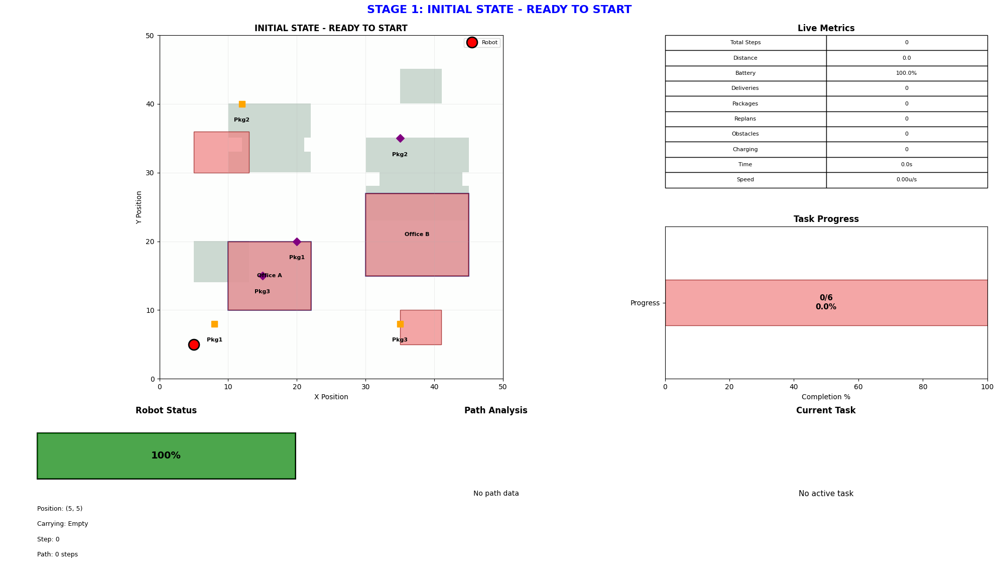

📸 Displayed: INITIAL STATE - READY TO START


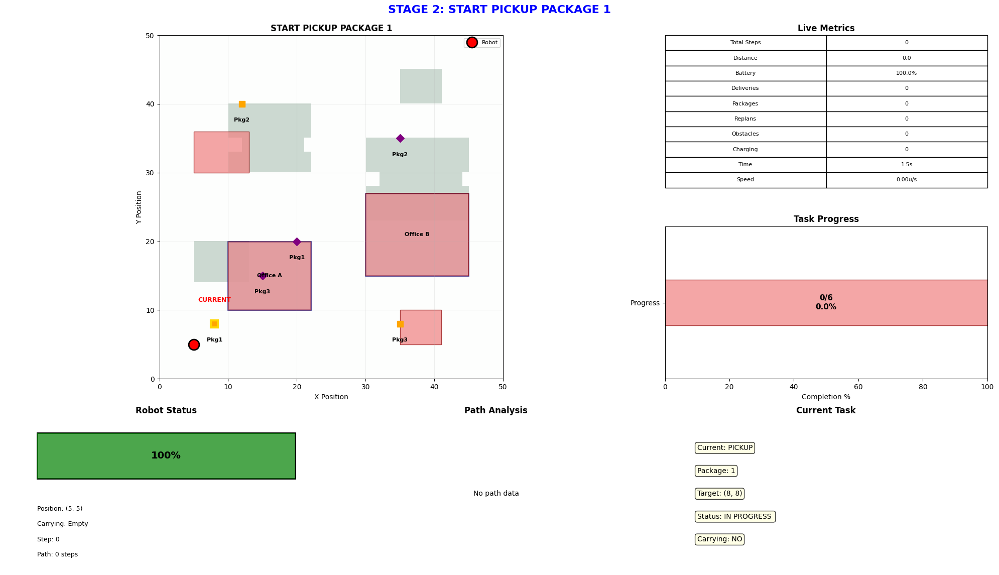

📸 Displayed: START PICKUP PACKAGE 1


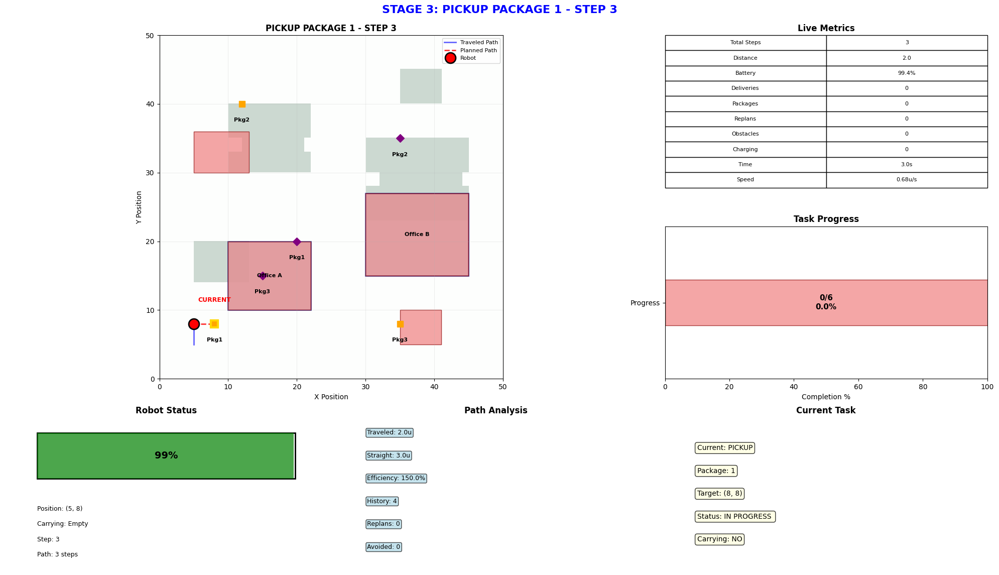

📸 Displayed: PICKUP PACKAGE 1 - STEP 3
   → Moving to (8, 8)... (Step 3, Battery: 99.4%)


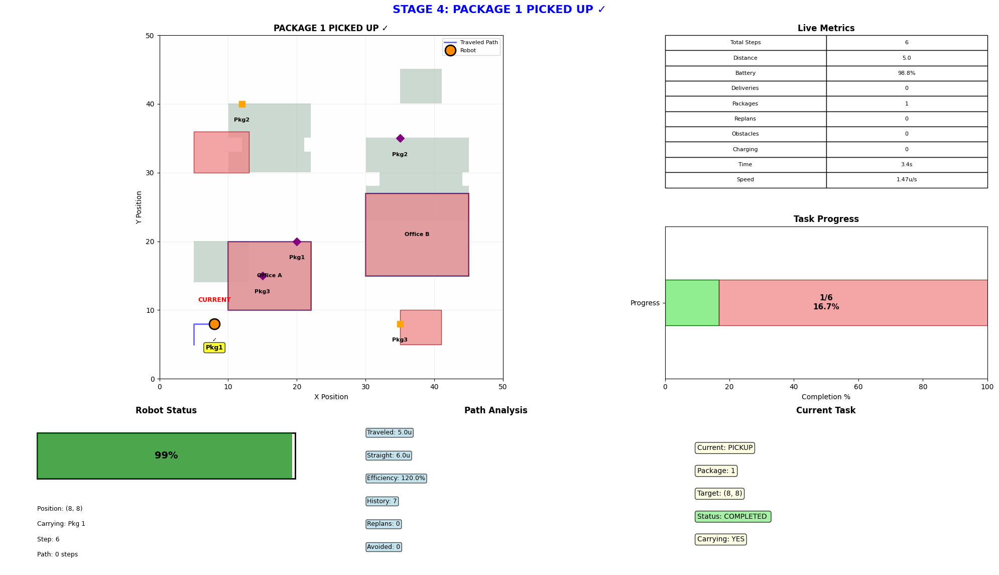

📸 Displayed: PACKAGE 1 PICKED UP ✓
   PICKUP completed!


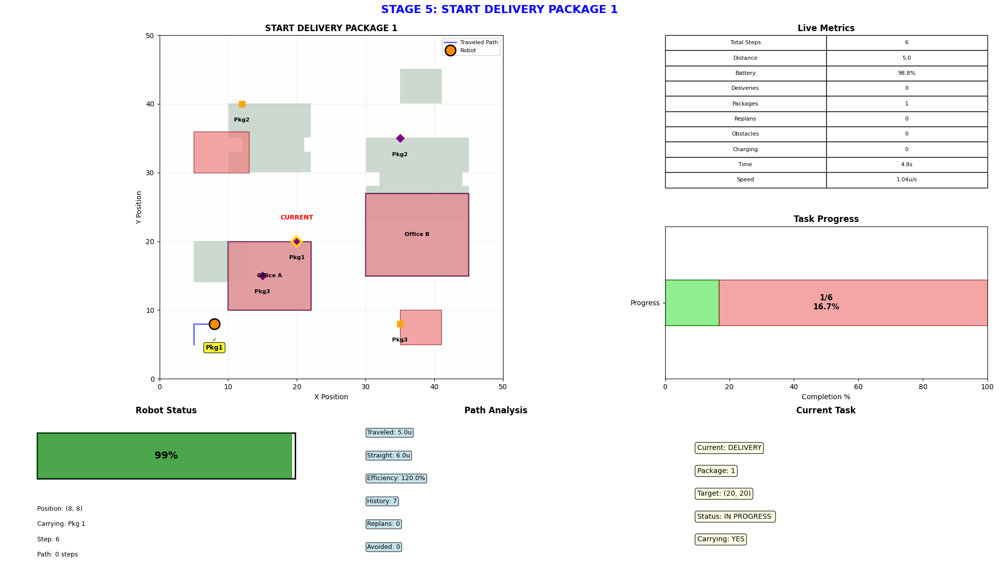

📸 Displayed: START DELIVERY PACKAGE 1


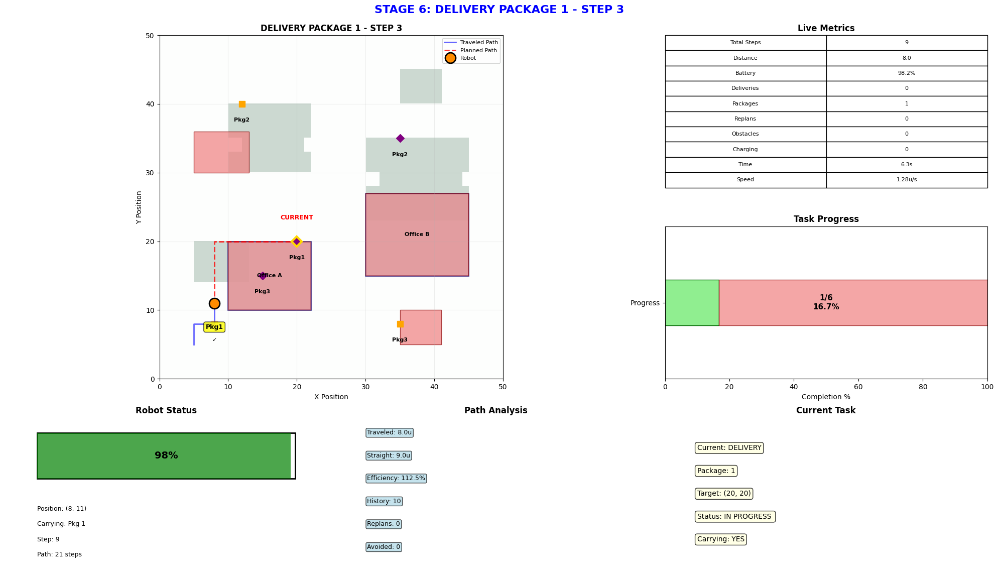

📸 Displayed: DELIVERY PACKAGE 1 - STEP 3
   → Moving to (20, 20)... (Step 3, Battery: 98.2%)


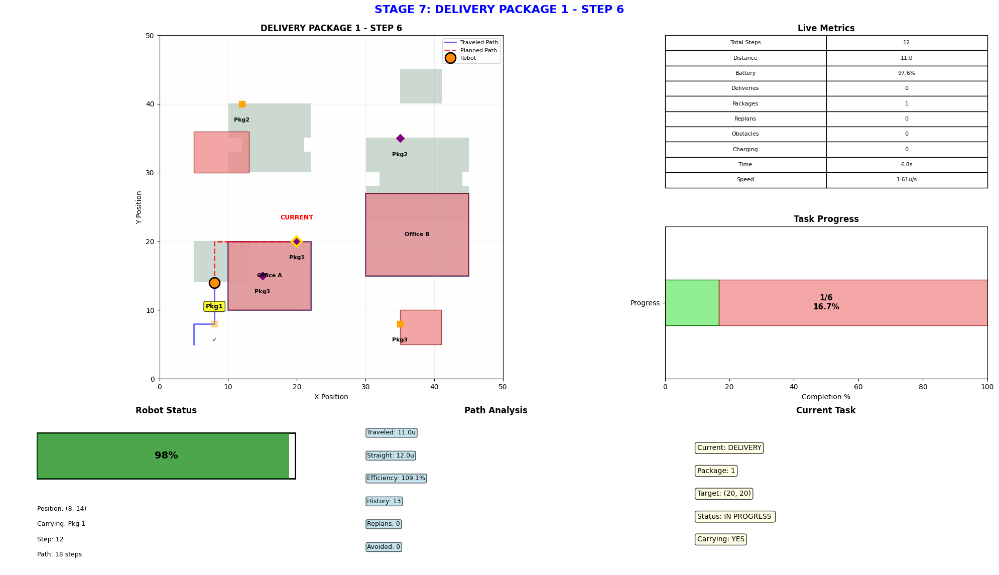

📸 Displayed: DELIVERY PACKAGE 1 - STEP 6
   → Moving to (20, 20)... (Step 6, Battery: 97.6%)


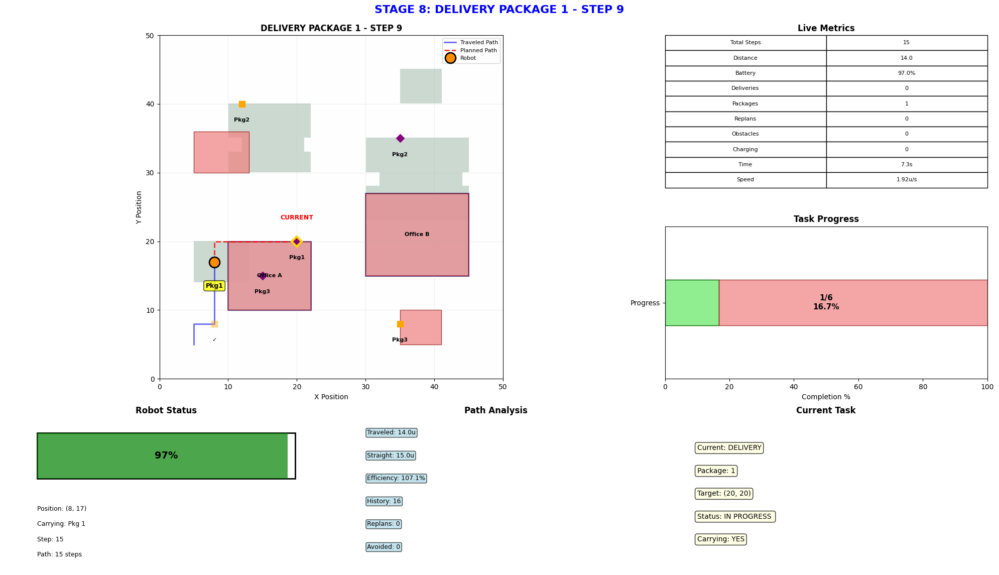

📸 Displayed: DELIVERY PACKAGE 1 - STEP 9
   → Moving to (20, 20)... (Step 9, Battery: 97.0%)


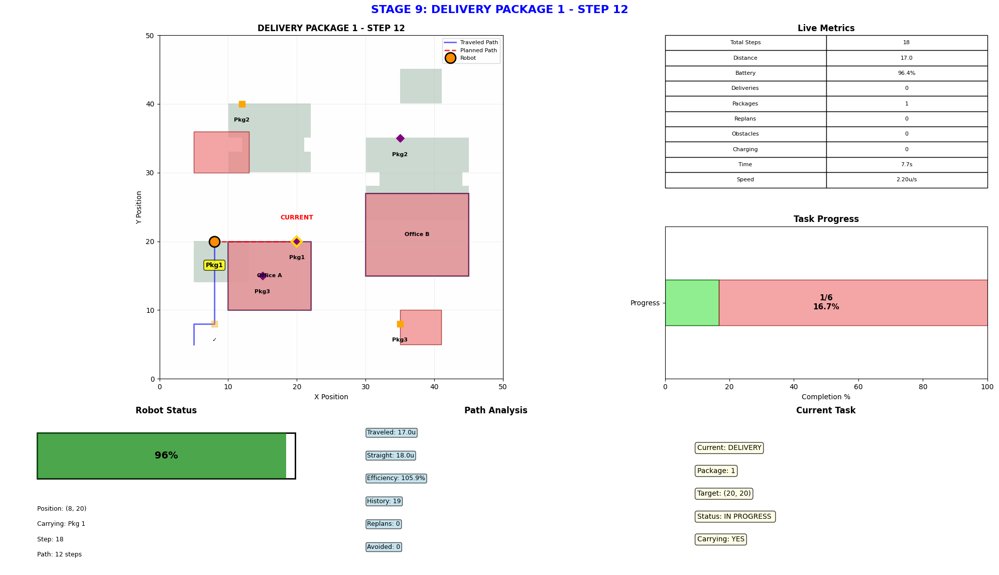

📸 Displayed: DELIVERY PACKAGE 1 - STEP 12
   → Moving to (20, 20)... (Step 12, Battery: 96.4%)


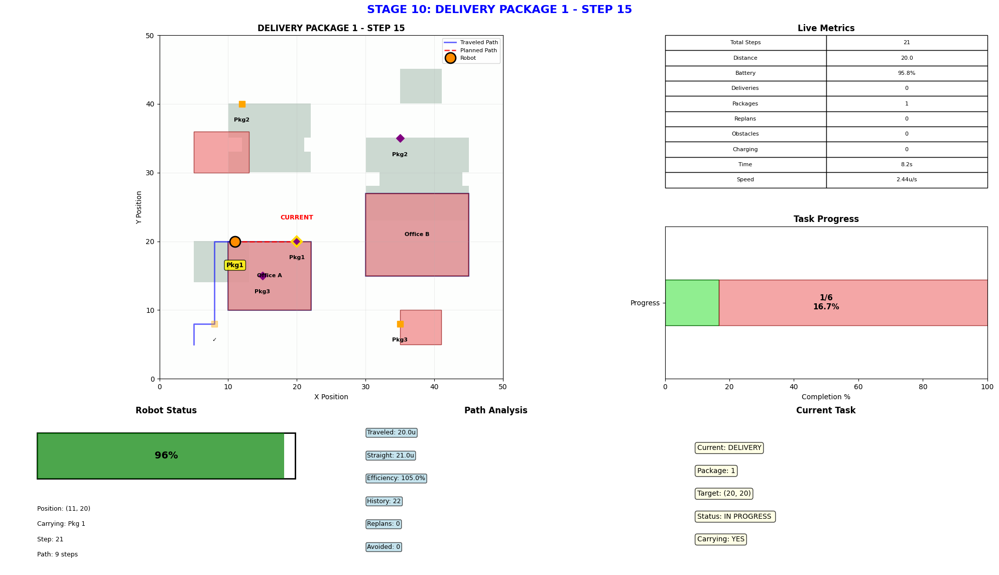

📸 Displayed: DELIVERY PACKAGE 1 - STEP 15
   → Moving to (20, 20)... (Step 15, Battery: 95.8%)


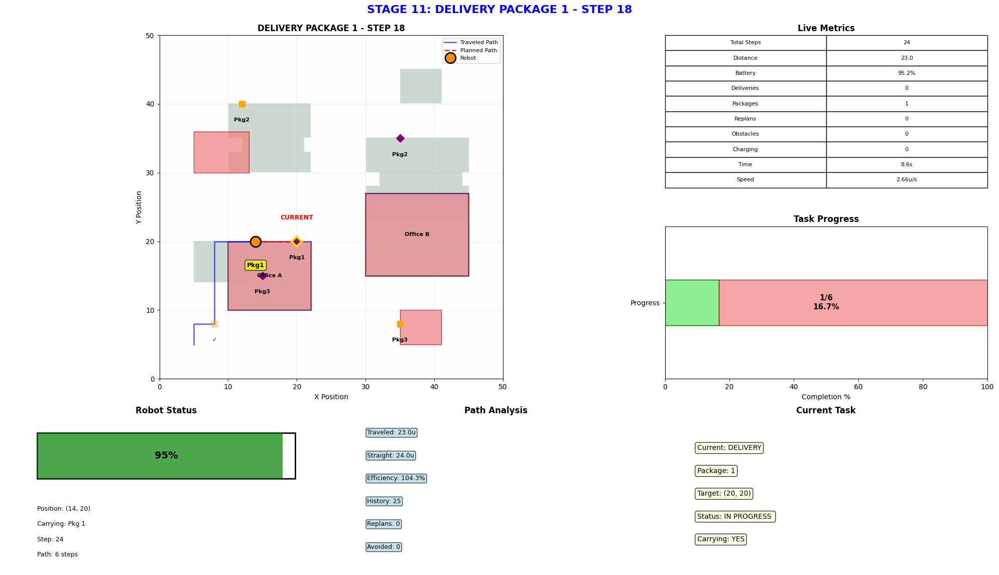

📸 Displayed: DELIVERY PACKAGE 1 - STEP 18
   → Moving to (20, 20)... (Step 18, Battery: 95.2%)


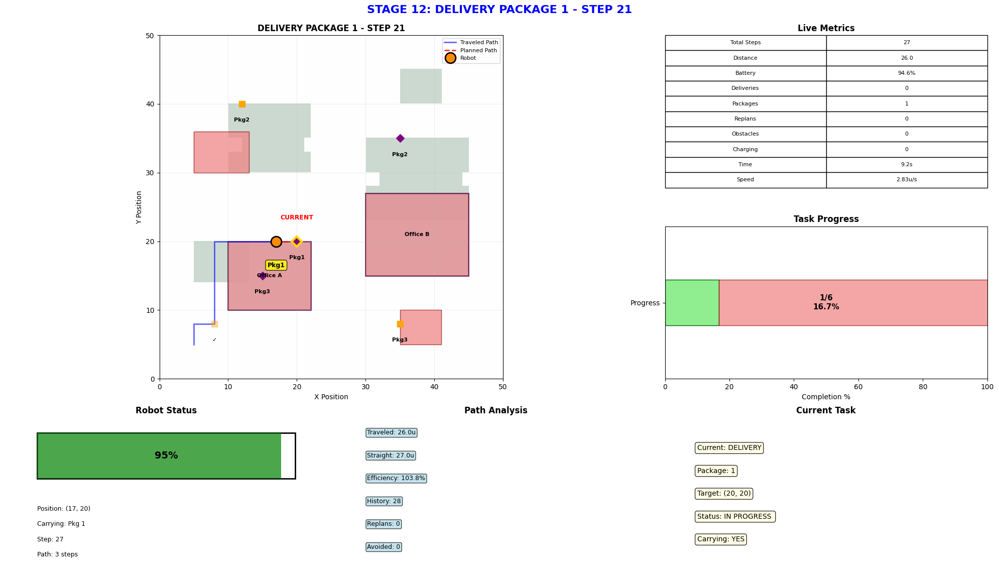

📸 Displayed: DELIVERY PACKAGE 1 - STEP 21
   → Moving to (20, 20)... (Step 21, Battery: 94.6%)


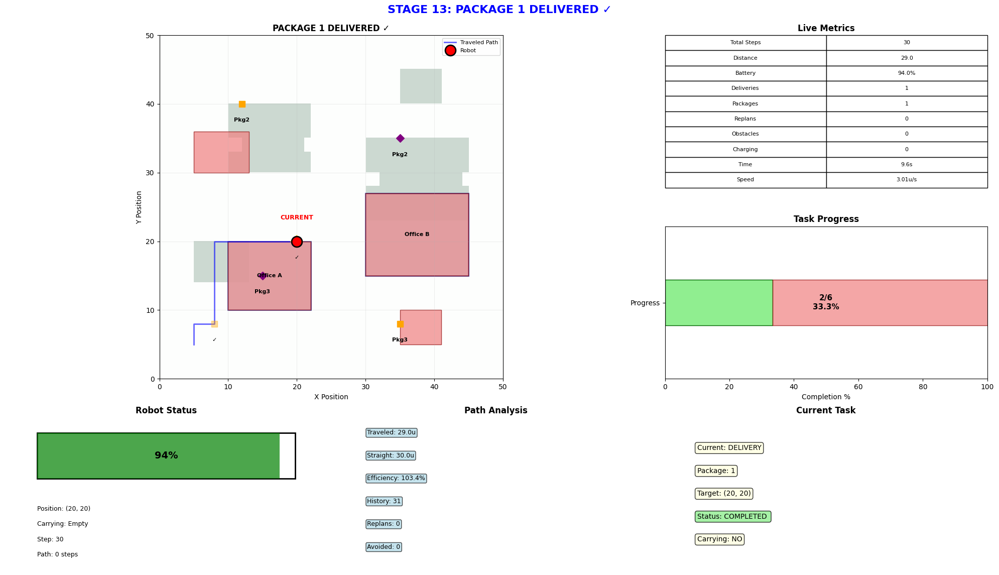

📸 Displayed: PACKAGE 1 DELIVERED ✓
   DELIVERY completed!


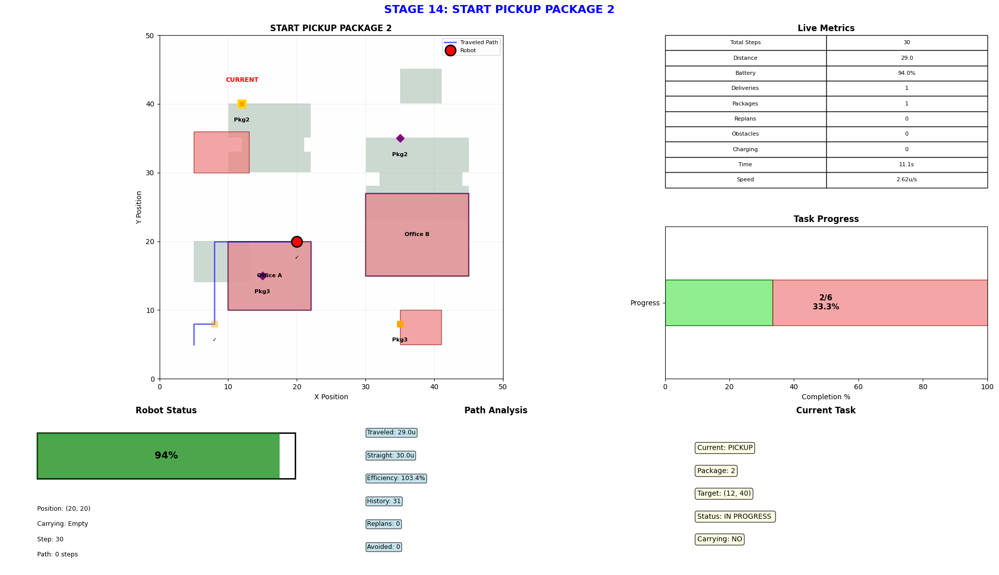

📸 Displayed: START PICKUP PACKAGE 2


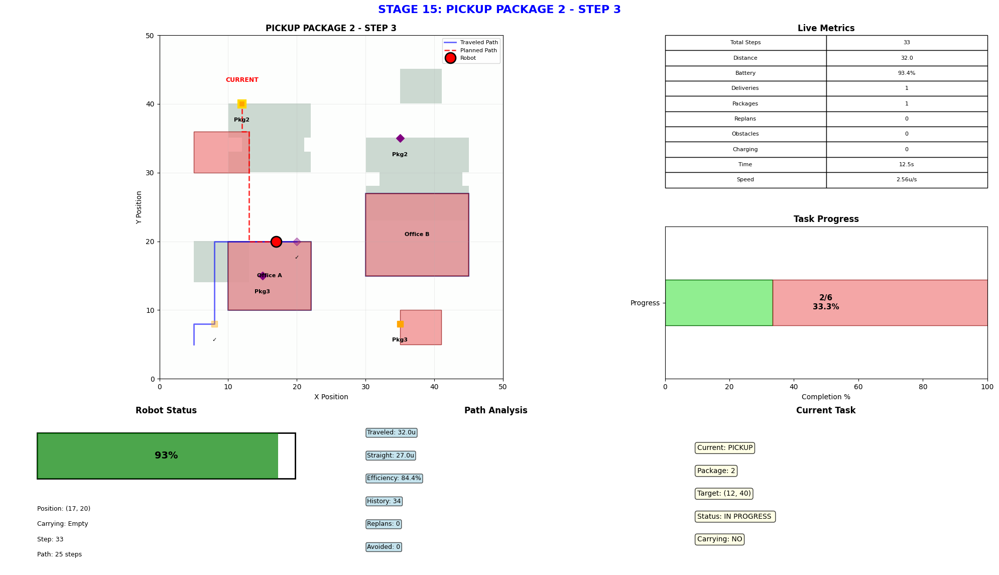

📸 Displayed: PICKUP PACKAGE 2 - STEP 3
   → Moving to (12, 40)... (Step 3, Battery: 93.4%)


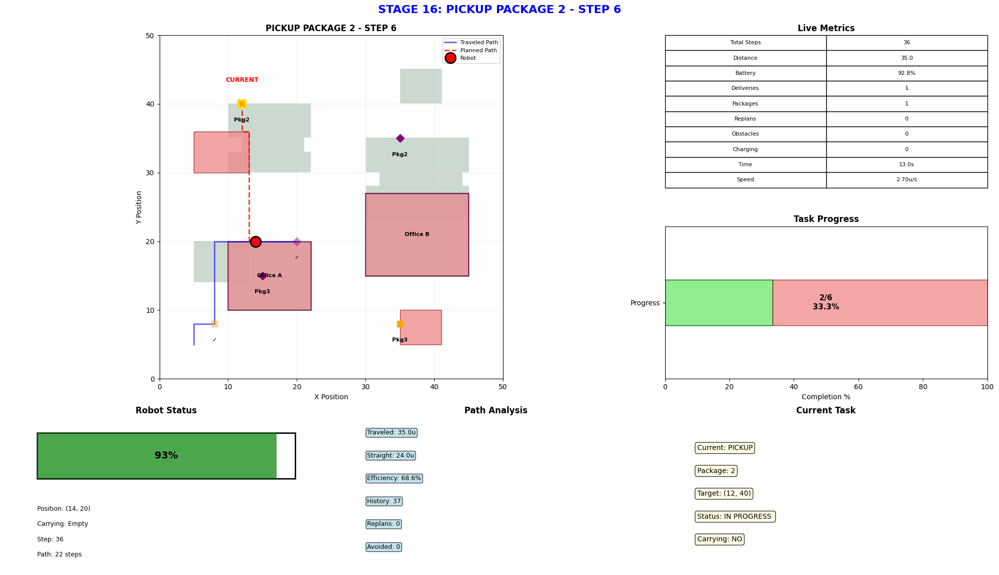

📸 Displayed: PICKUP PACKAGE 2 - STEP 6
   → Moving to (12, 40)... (Step 6, Battery: 92.8%)


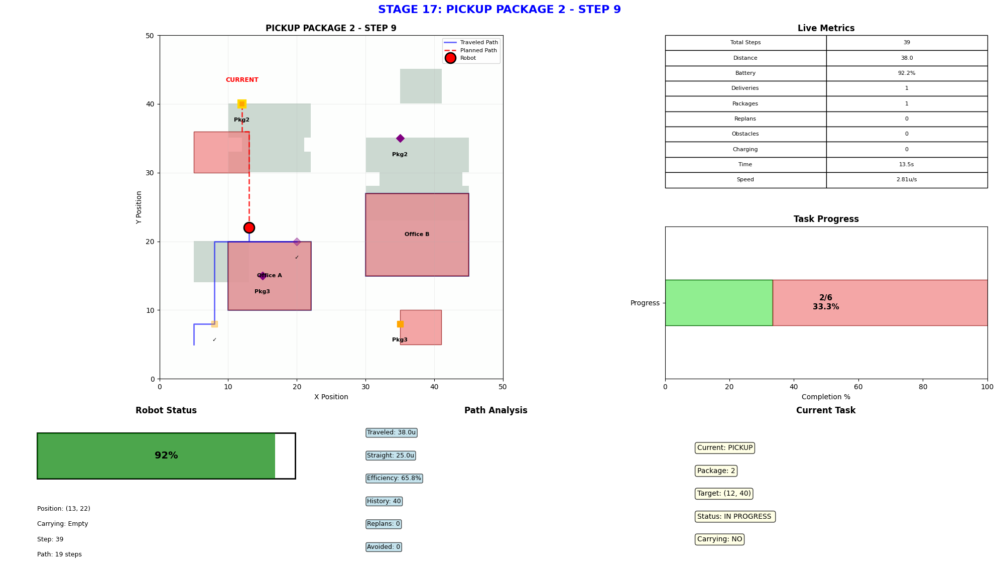

📸 Displayed: PICKUP PACKAGE 2 - STEP 9
   → Moving to (12, 40)... (Step 9, Battery: 92.2%)


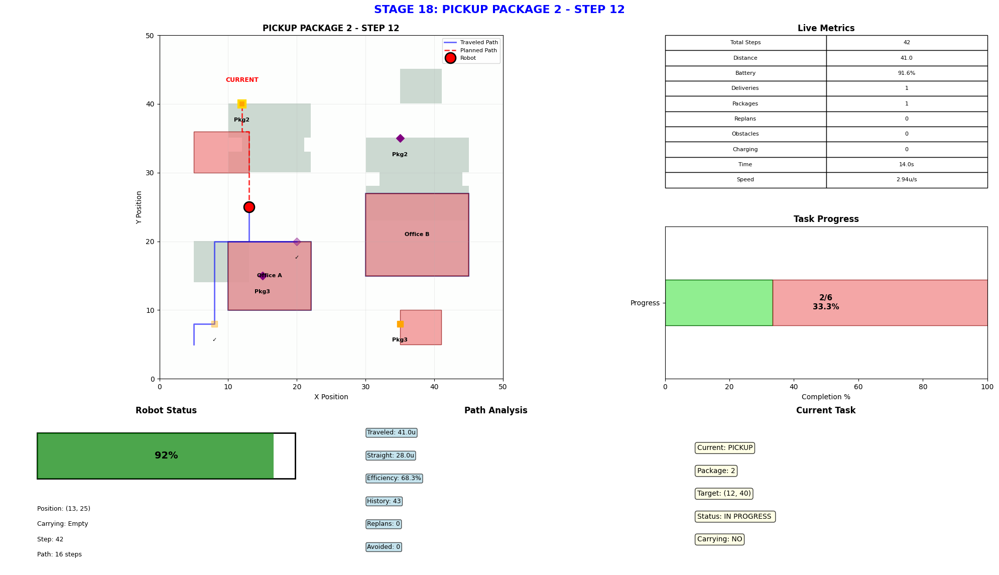

📸 Displayed: PICKUP PACKAGE 2 - STEP 12
   → Moving to (12, 40)... (Step 12, Battery: 91.6%)


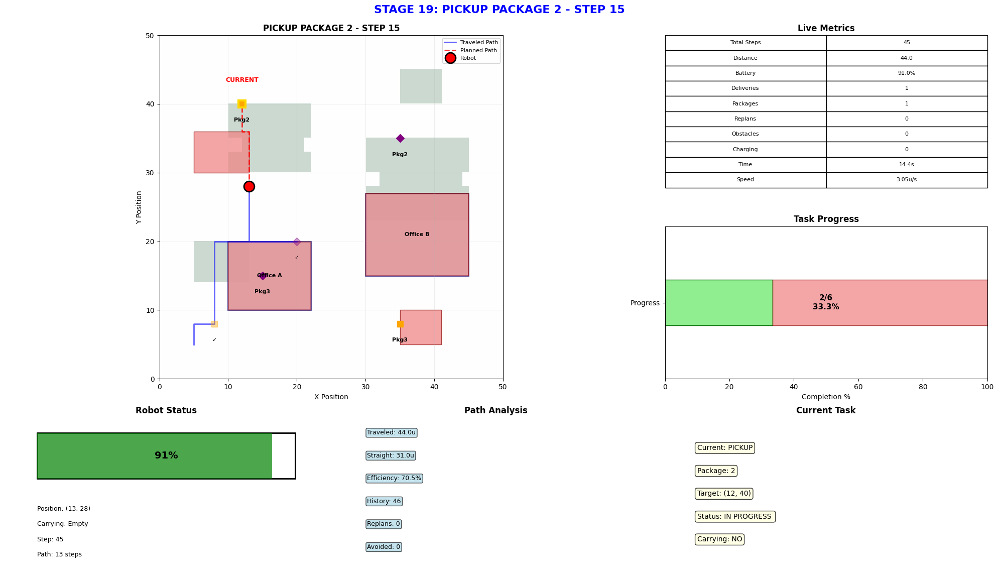

📸 Displayed: PICKUP PACKAGE 2 - STEP 15
   → Moving to (12, 40)... (Step 15, Battery: 91.0%)


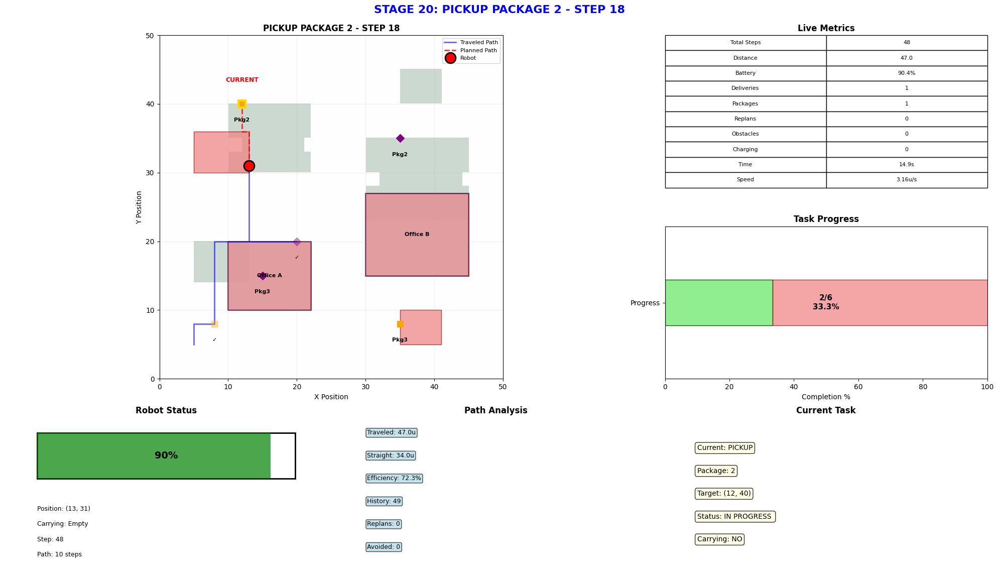

📸 Displayed: PICKUP PACKAGE 2 - STEP 18
   → Moving to (12, 40)... (Step 18, Battery: 90.4%)


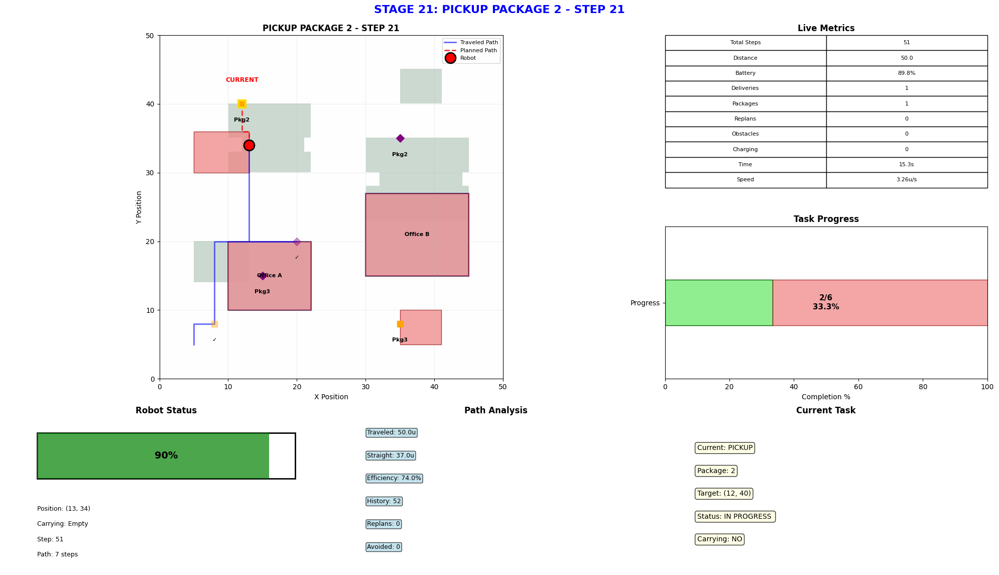

📸 Displayed: PICKUP PACKAGE 2 - STEP 21
   → Moving to (12, 40)... (Step 21, Battery: 89.8%)


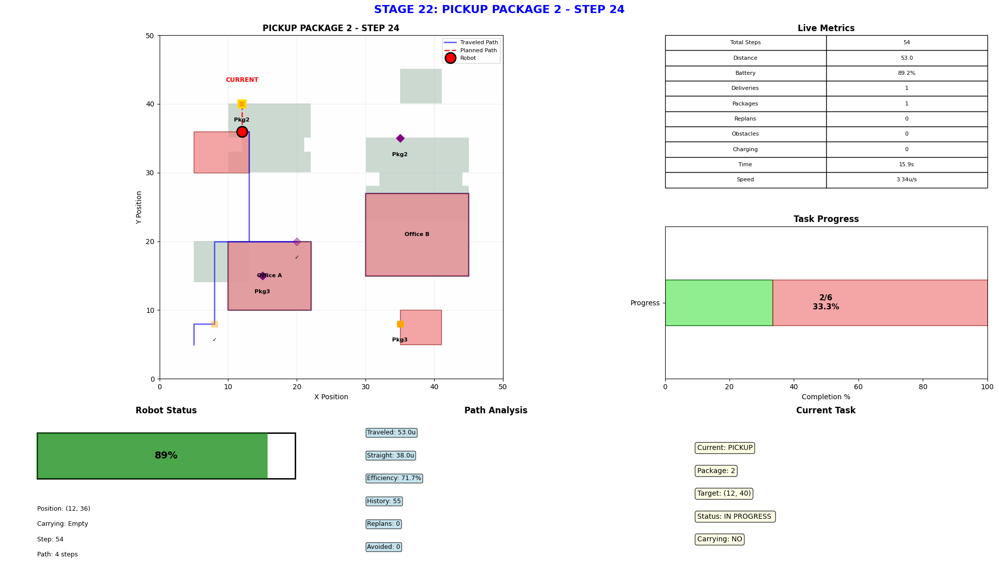

📸 Displayed: PICKUP PACKAGE 2 - STEP 24
   → Moving to (12, 40)... (Step 24, Battery: 89.2%)


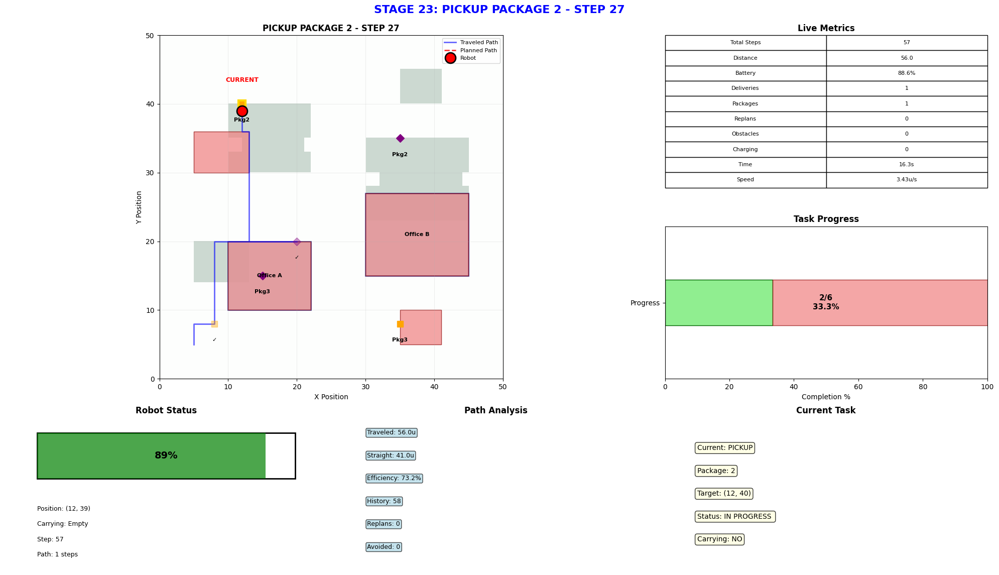

📸 Displayed: PICKUP PACKAGE 2 - STEP 27
   → Moving to (12, 40)... (Step 27, Battery: 88.6%)


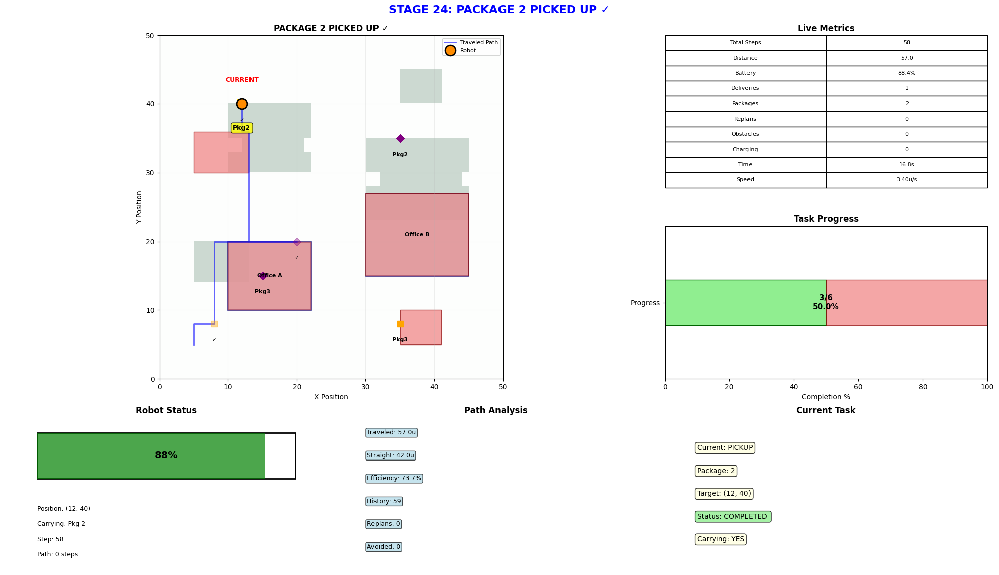

📸 Displayed: PACKAGE 2 PICKED UP ✓
   PICKUP completed!


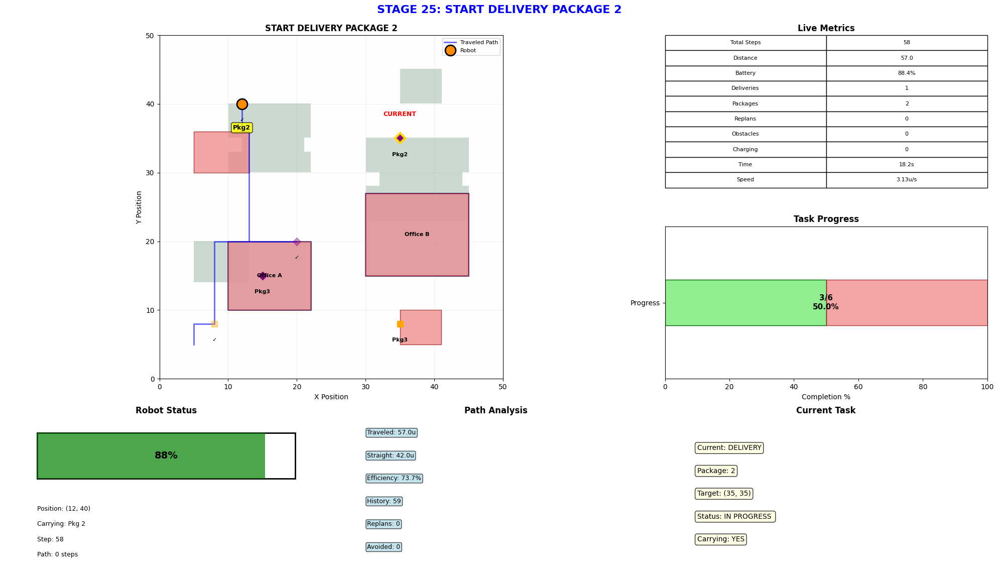

📸 Displayed: START DELIVERY PACKAGE 2


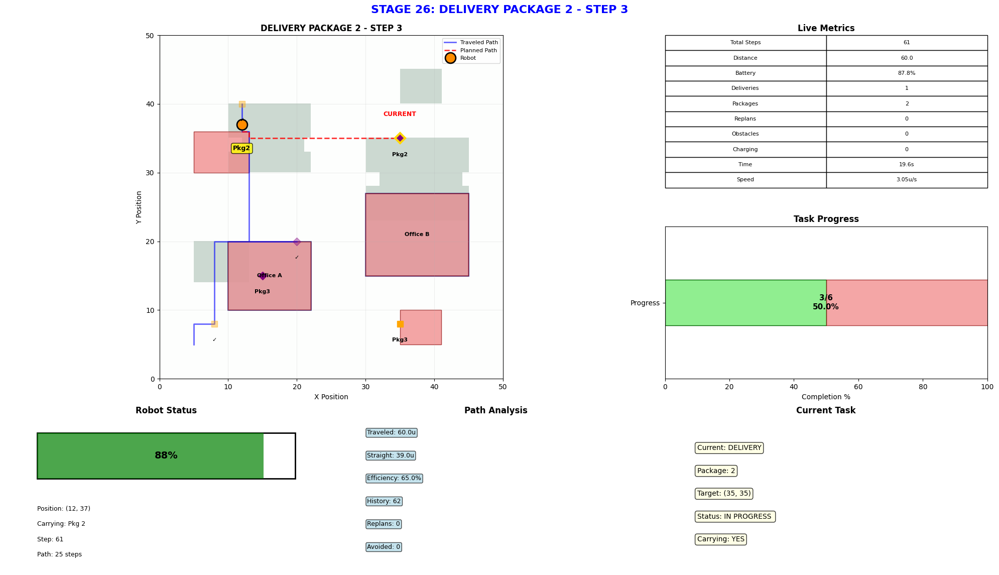

📸 Displayed: DELIVERY PACKAGE 2 - STEP 3
   → Moving to (35, 35)... (Step 3, Battery: 87.8%)


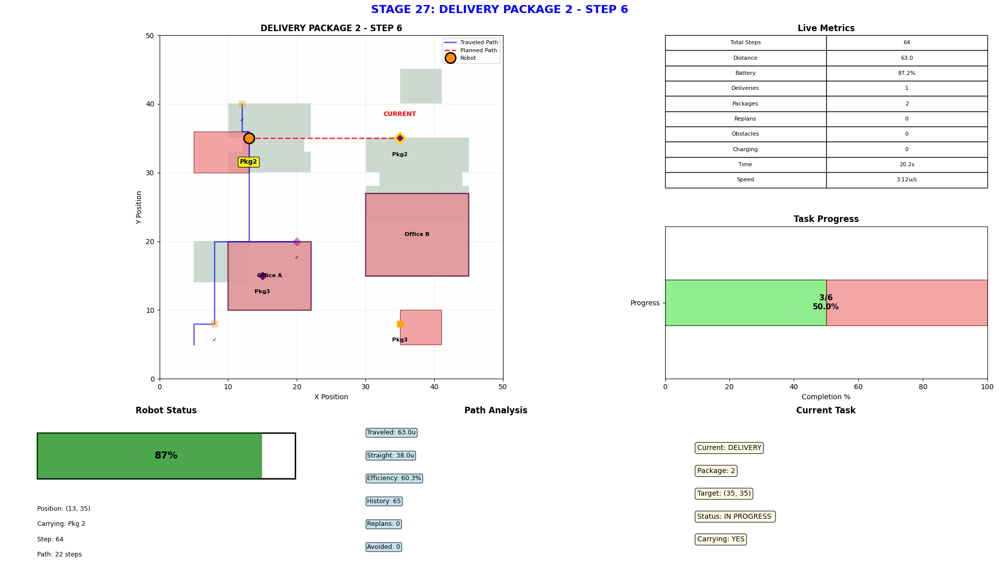

📸 Displayed: DELIVERY PACKAGE 2 - STEP 6
   → Moving to (35, 35)... (Step 6, Battery: 87.2%)


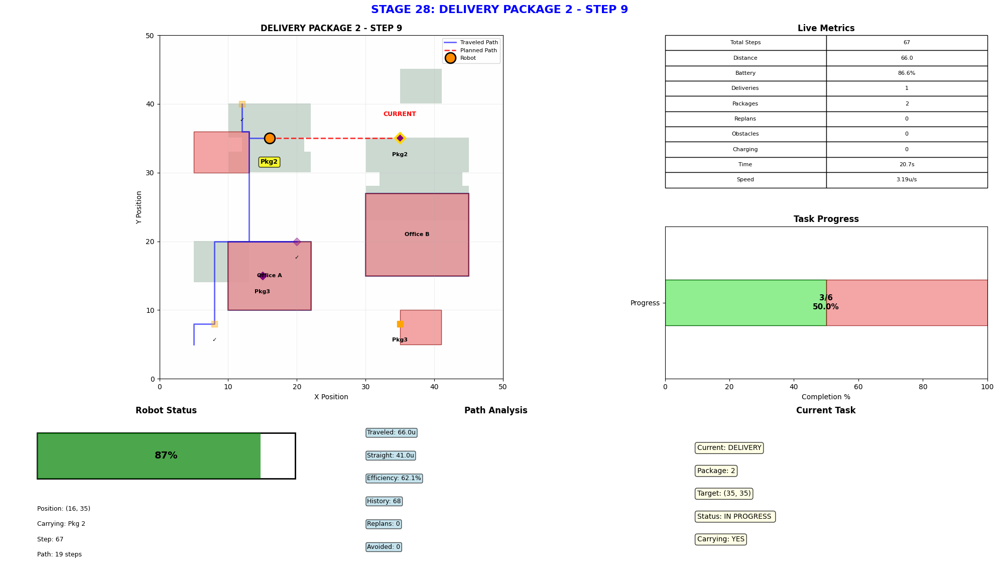

📸 Displayed: DELIVERY PACKAGE 2 - STEP 9
   → Moving to (35, 35)... (Step 9, Battery: 86.6%)


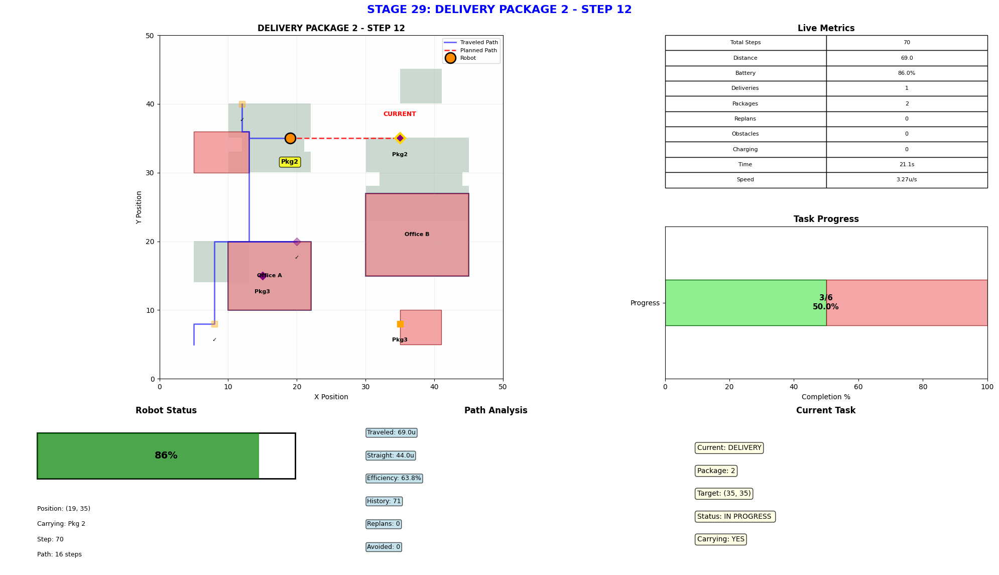

📸 Displayed: DELIVERY PACKAGE 2 - STEP 12
   → Moving to (35, 35)... (Step 12, Battery: 86.0%)


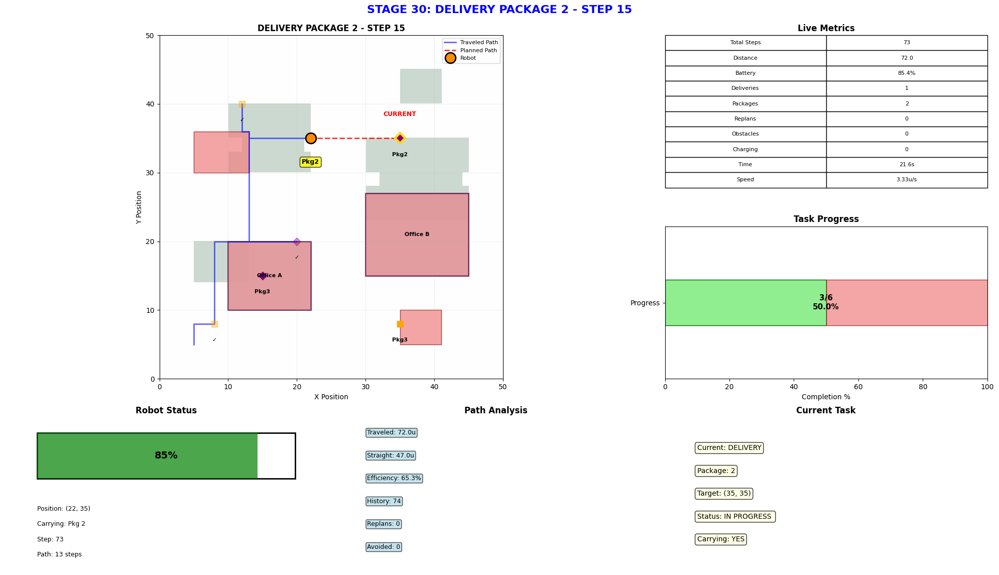

📸 Displayed: DELIVERY PACKAGE 2 - STEP 15
   → Moving to (35, 35)... (Step 15, Battery: 85.4%)


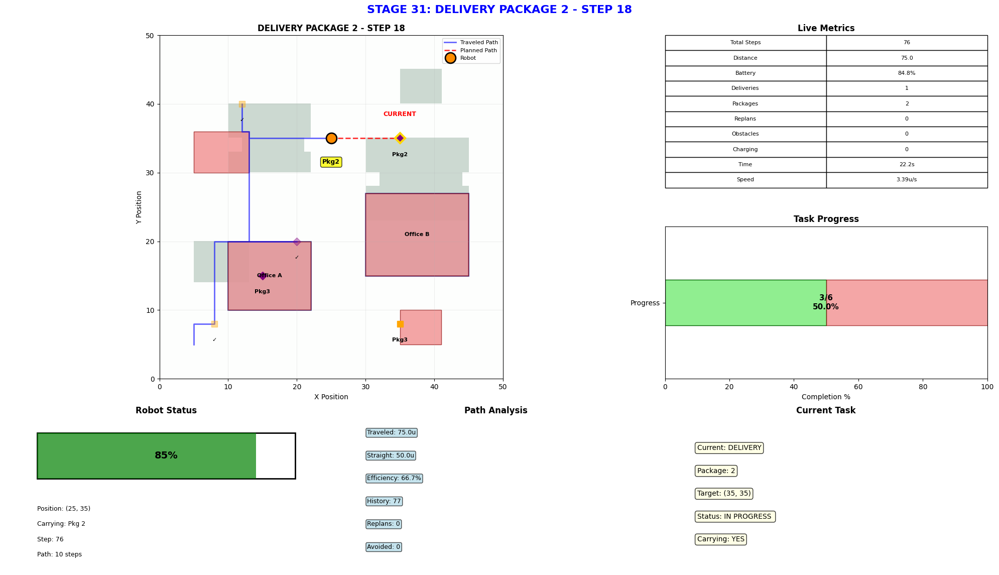

📸 Displayed: DELIVERY PACKAGE 2 - STEP 18
   → Moving to (35, 35)... (Step 18, Battery: 84.8%)


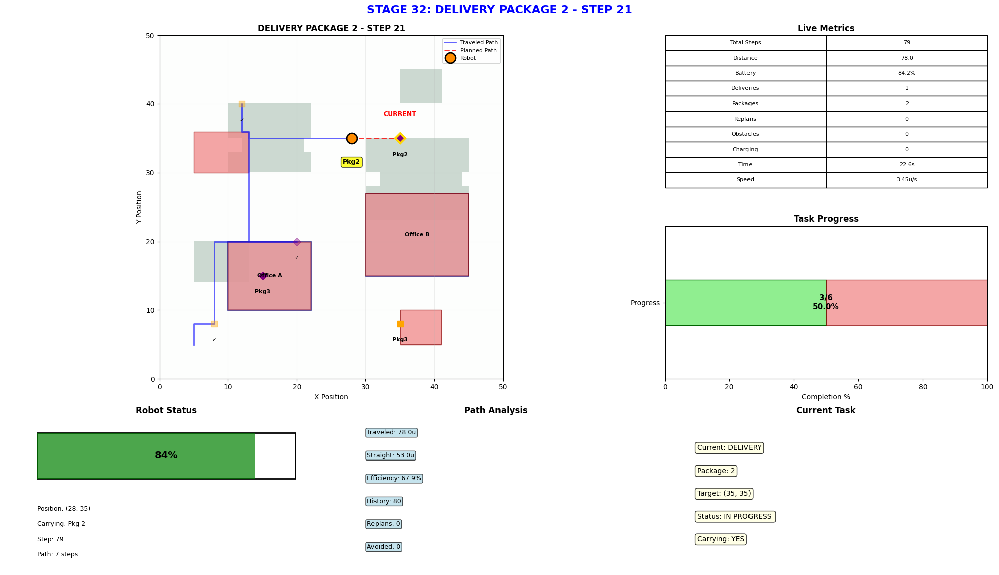

📸 Displayed: DELIVERY PACKAGE 2 - STEP 21
   → Moving to (35, 35)... (Step 21, Battery: 84.2%)


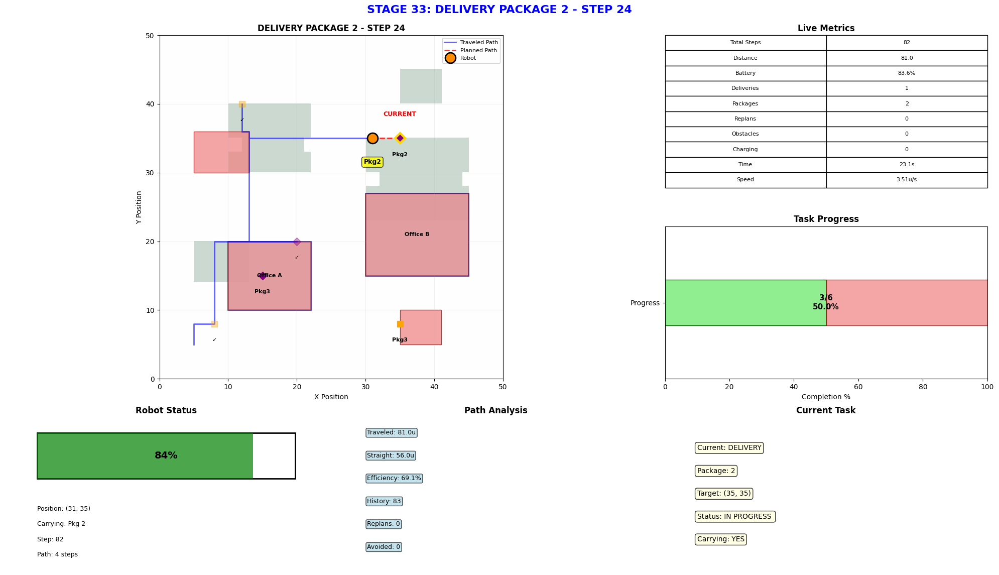

📸 Displayed: DELIVERY PACKAGE 2 - STEP 24
   → Moving to (35, 35)... (Step 24, Battery: 83.6%)


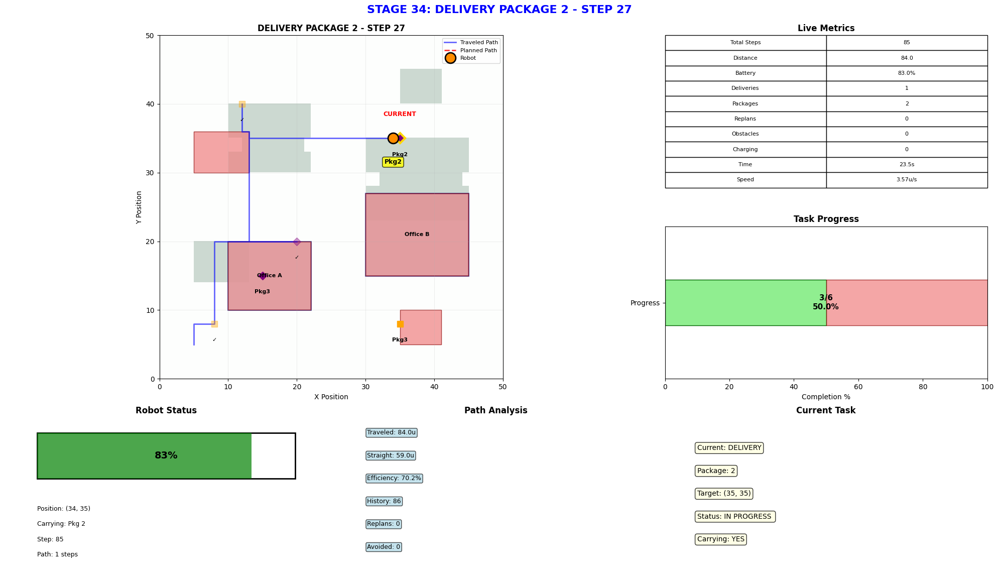

📸 Displayed: DELIVERY PACKAGE 2 - STEP 27
   → Moving to (35, 35)... (Step 27, Battery: 83.0%)


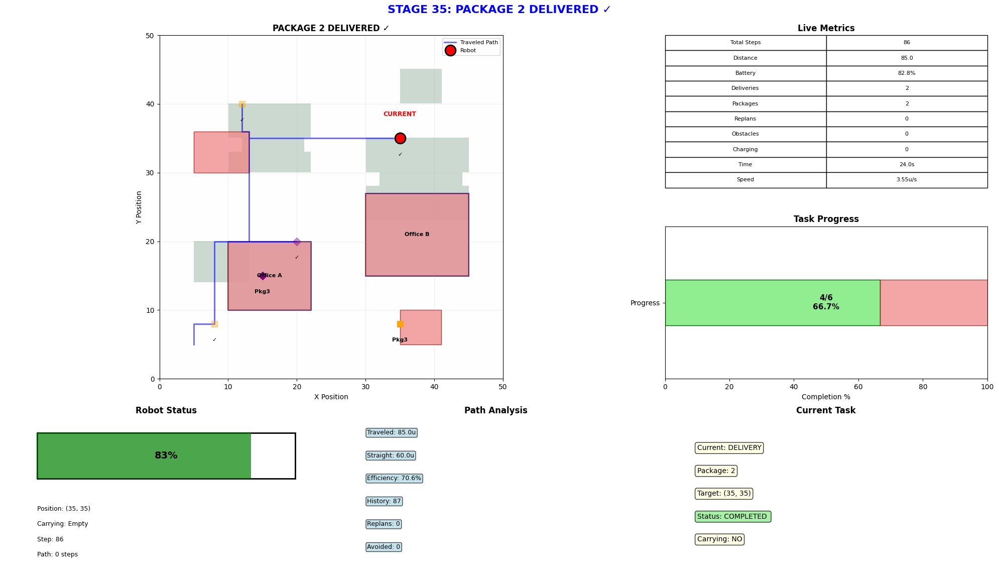

📸 Displayed: PACKAGE 2 DELIVERED ✓
   DELIVERY completed!


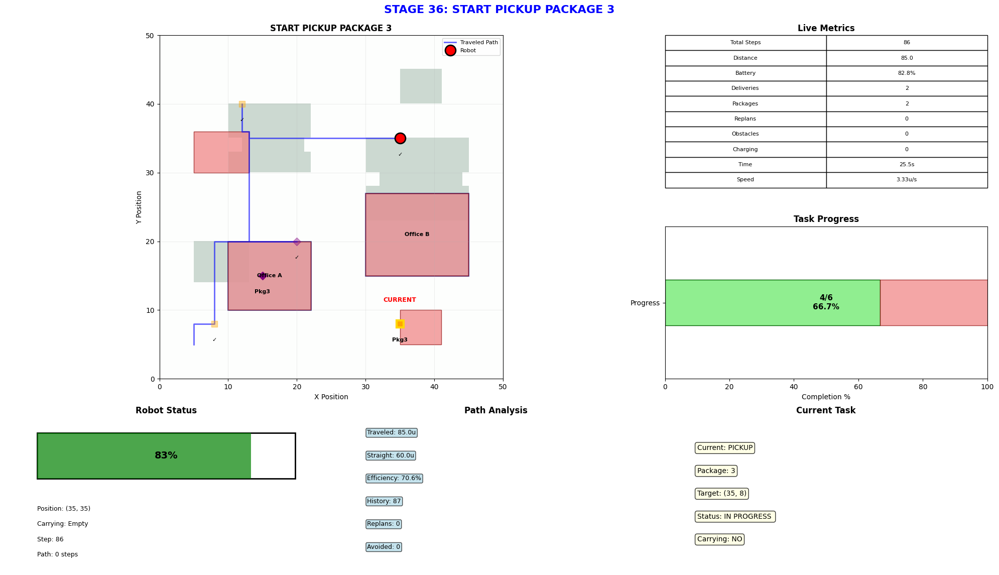

📸 Displayed: START PICKUP PACKAGE 3


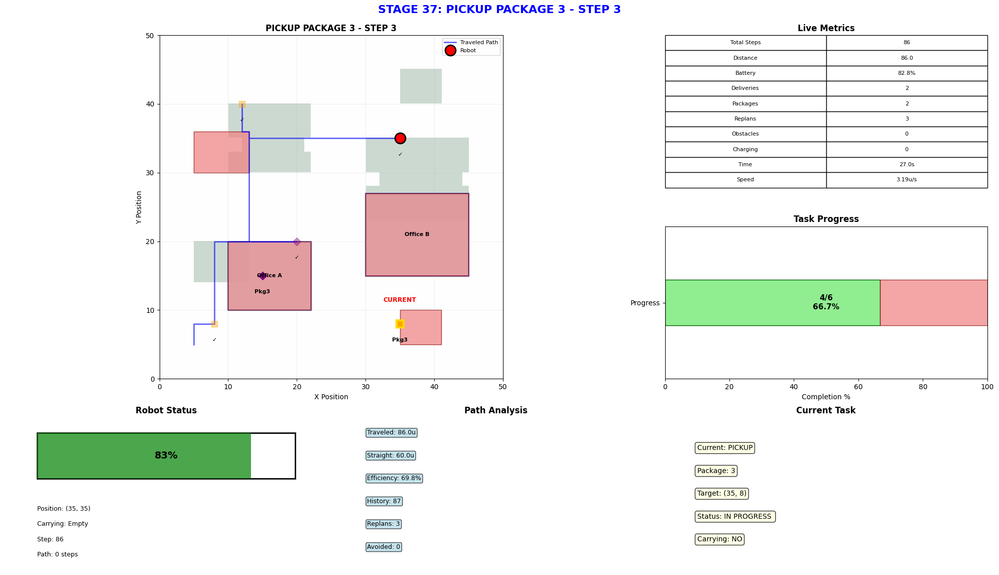

📸 Displayed: PICKUP PACKAGE 3 - STEP 3
   → Moving to (35, 8)... (Step 3, Battery: 82.8%)


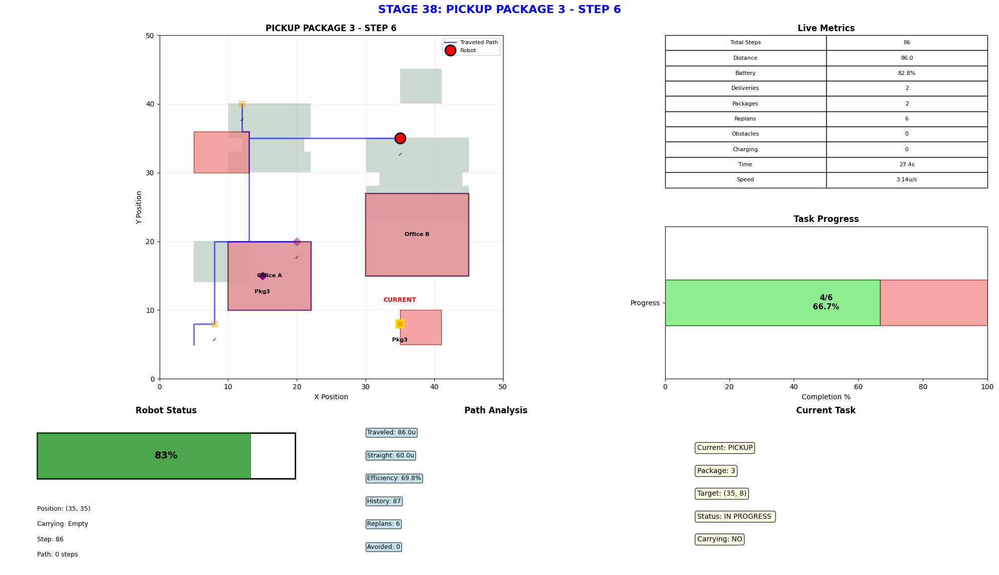

📸 Displayed: PICKUP PACKAGE 3 - STEP 6
   → Moving to (35, 8)... (Step 6, Battery: 82.8%)


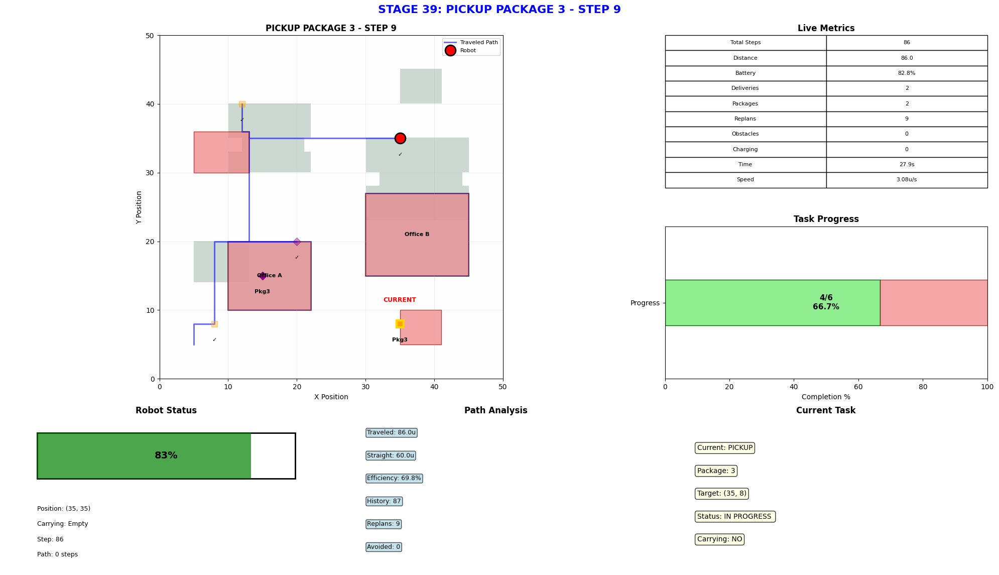

📸 Displayed: PICKUP PACKAGE 3 - STEP 9
   → Moving to (35, 8)... (Step 9, Battery: 82.8%)


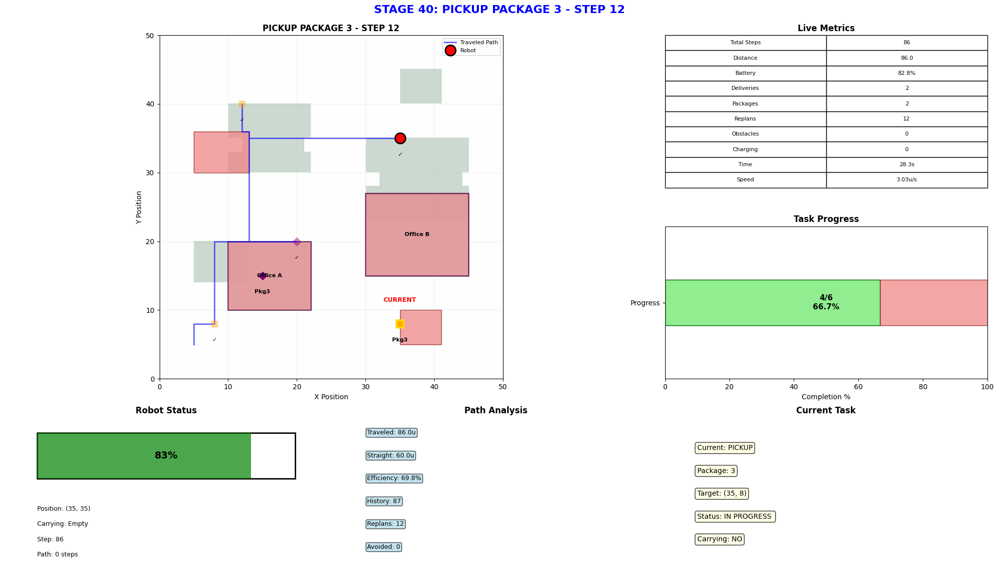

📸 Displayed: PICKUP PACKAGE 3 - STEP 12
   → Moving to (35, 8)... (Step 12, Battery: 82.8%)


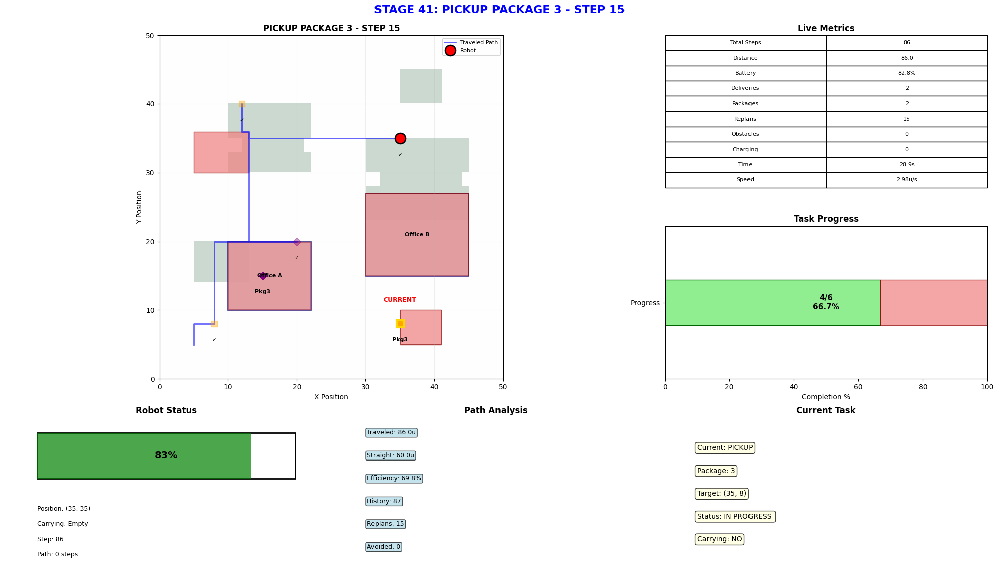

📸 Displayed: PICKUP PACKAGE 3 - STEP 15
   → Moving to (35, 8)... (Step 15, Battery: 82.8%)


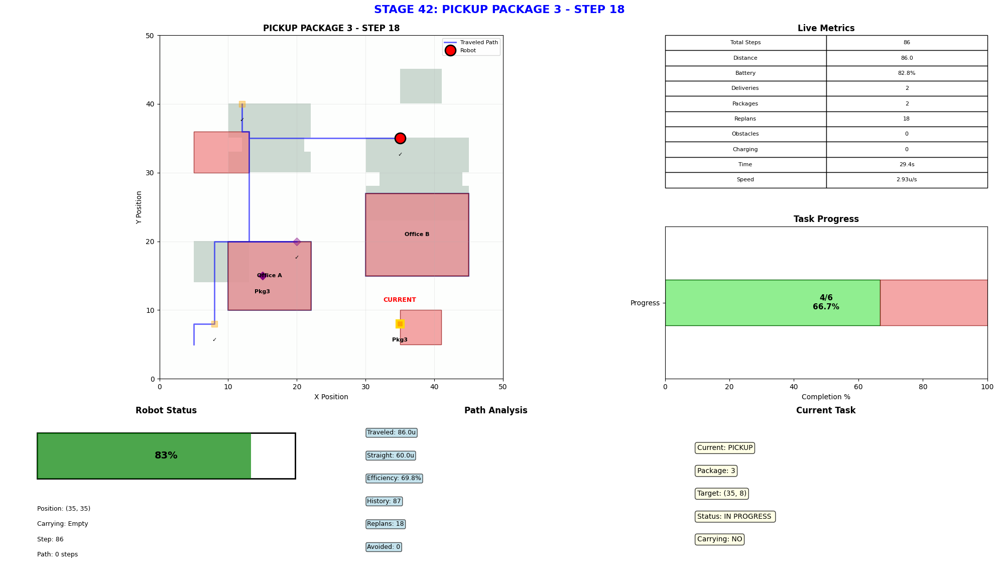

📸 Displayed: PICKUP PACKAGE 3 - STEP 18
   → Moving to (35, 8)... (Step 18, Battery: 82.8%)


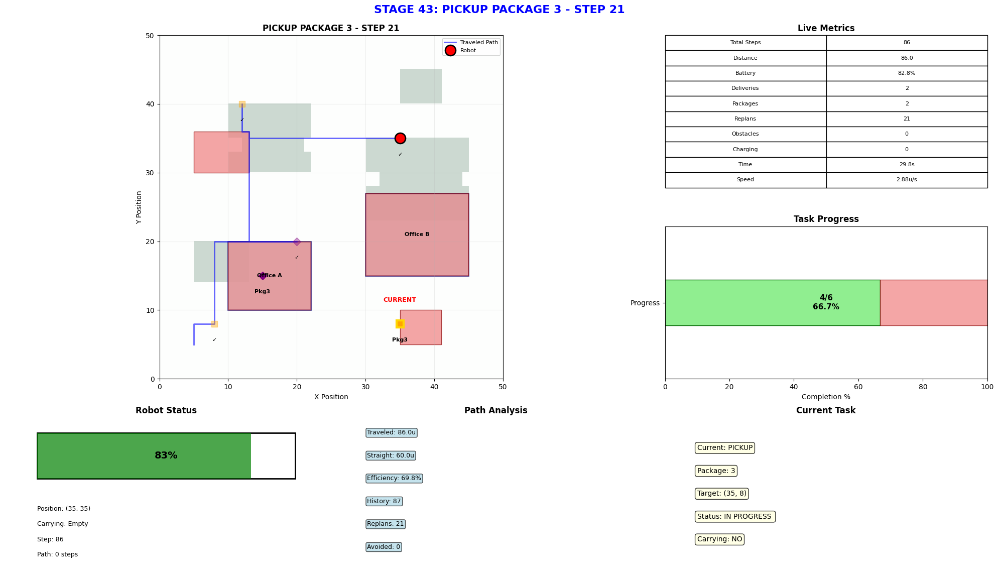

📸 Displayed: PICKUP PACKAGE 3 - STEP 21
   → Moving to (35, 8)... (Step 21, Battery: 82.8%)


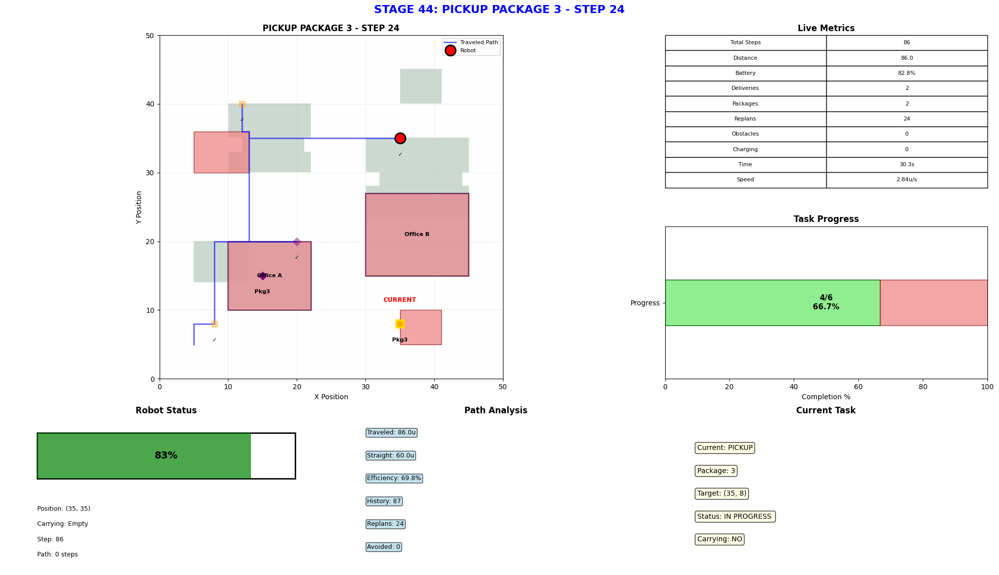

📸 Displayed: PICKUP PACKAGE 3 - STEP 24
   → Moving to (35, 8)... (Step 24, Battery: 82.8%)


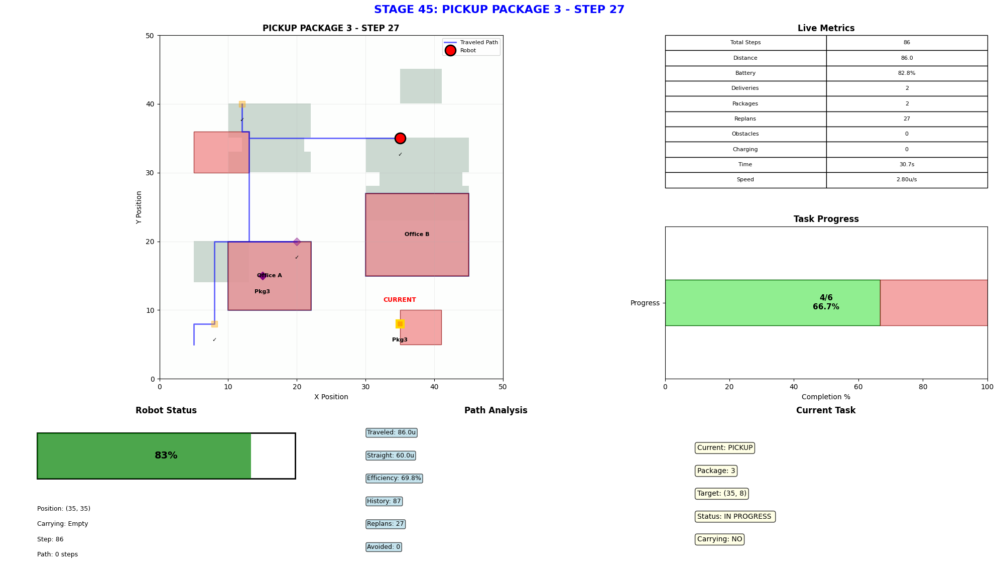

📸 Displayed: PICKUP PACKAGE 3 - STEP 27
   → Moving to (35, 8)... (Step 27, Battery: 82.8%)


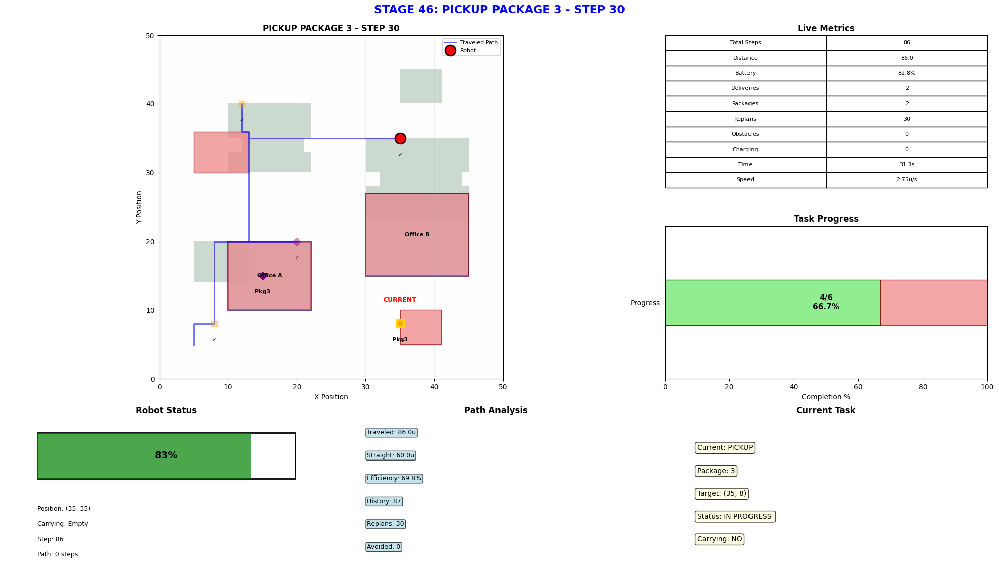

📸 Displayed: PICKUP PACKAGE 3 - STEP 30
   → Moving to (35, 8)... (Step 30, Battery: 82.8%)


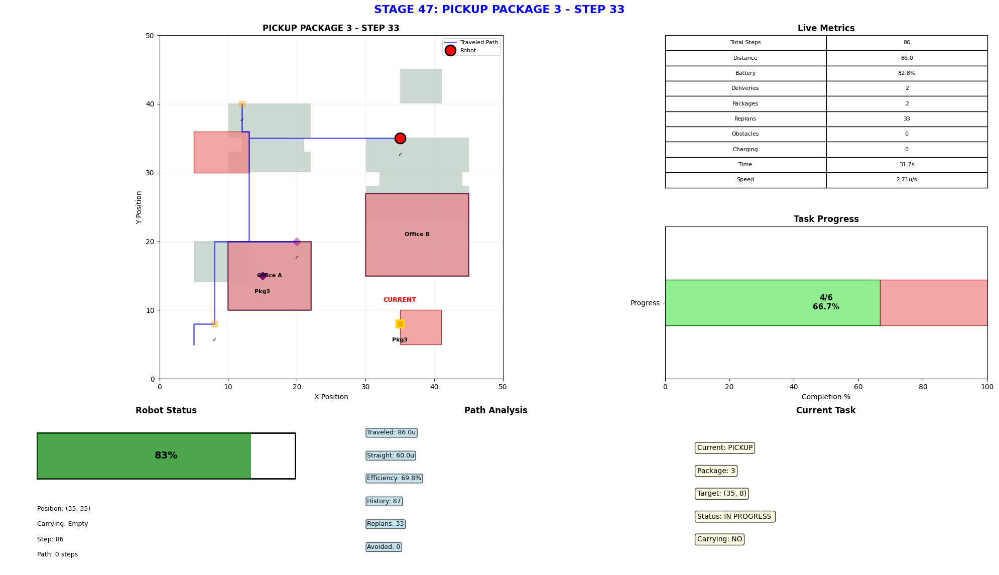

📸 Displayed: PICKUP PACKAGE 3 - STEP 33
   → Moving to (35, 8)... (Step 33, Battery: 82.8%)


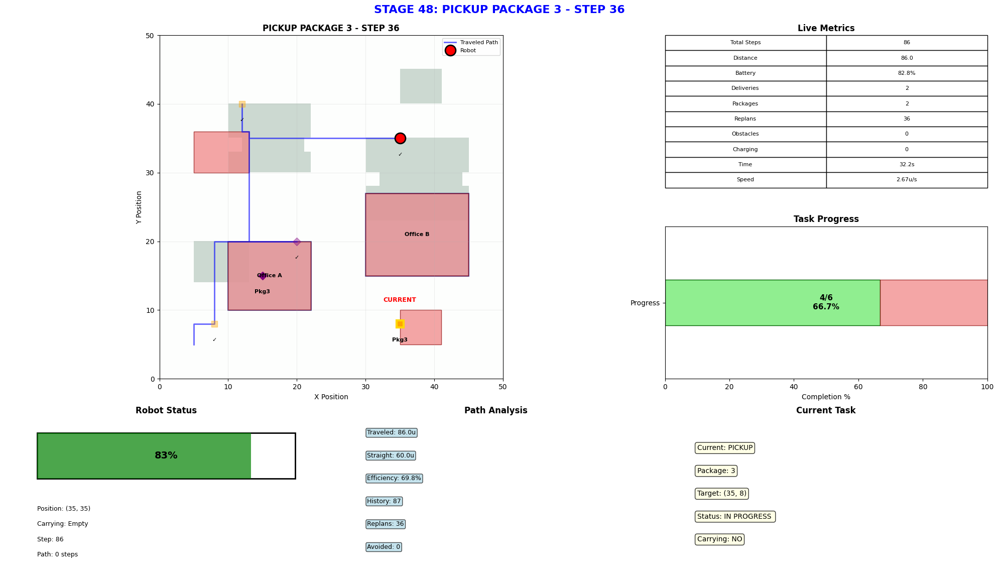

📸 Displayed: PICKUP PACKAGE 3 - STEP 36
   → Moving to (35, 8)... (Step 36, Battery: 82.8%)


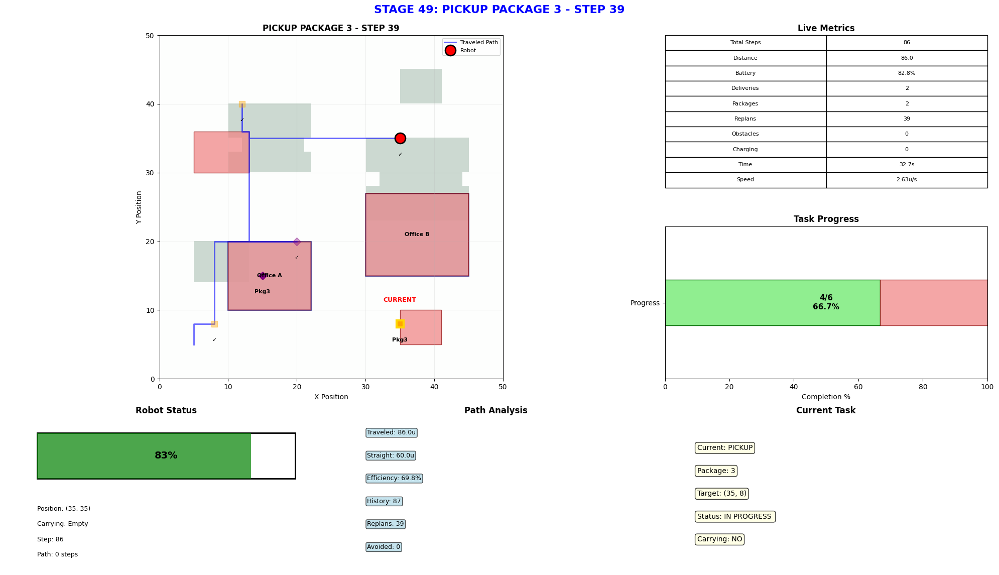

📸 Displayed: PICKUP PACKAGE 3 - STEP 39
   → Moving to (35, 8)... (Step 39, Battery: 82.8%)


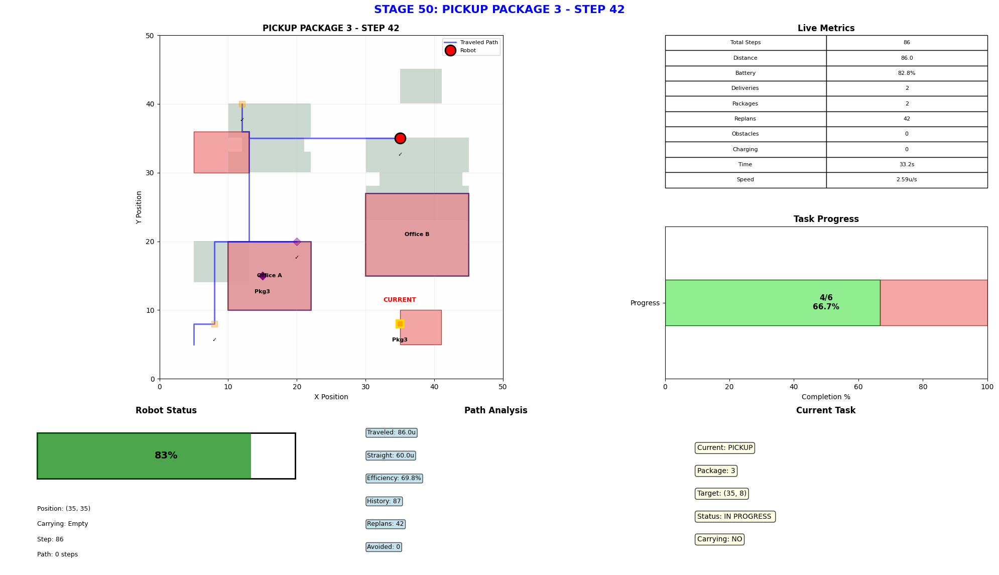

📸 Displayed: PICKUP PACKAGE 3 - STEP 42
   → Moving to (35, 8)... (Step 42, Battery: 82.8%)


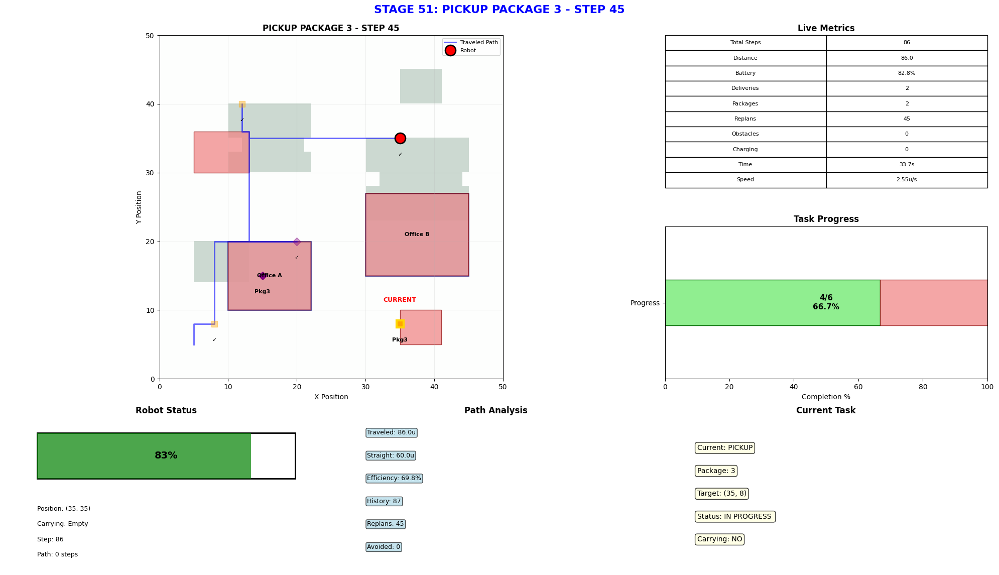

📸 Displayed: PICKUP PACKAGE 3 - STEP 45
   → Moving to (35, 8)... (Step 45, Battery: 82.8%)


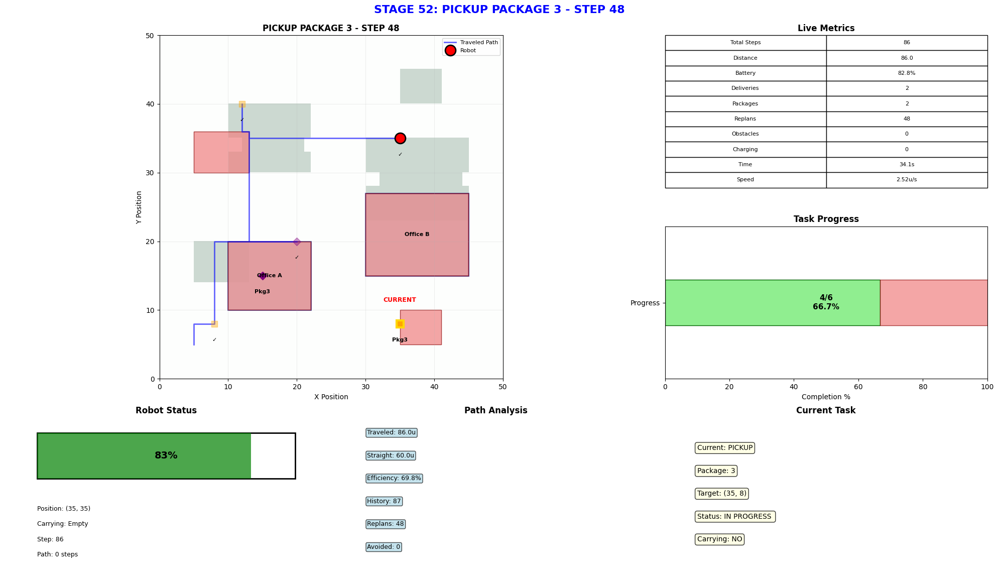

📸 Displayed: PICKUP PACKAGE 3 - STEP 48
   → Moving to (35, 8)... (Step 48, Battery: 82.8%)


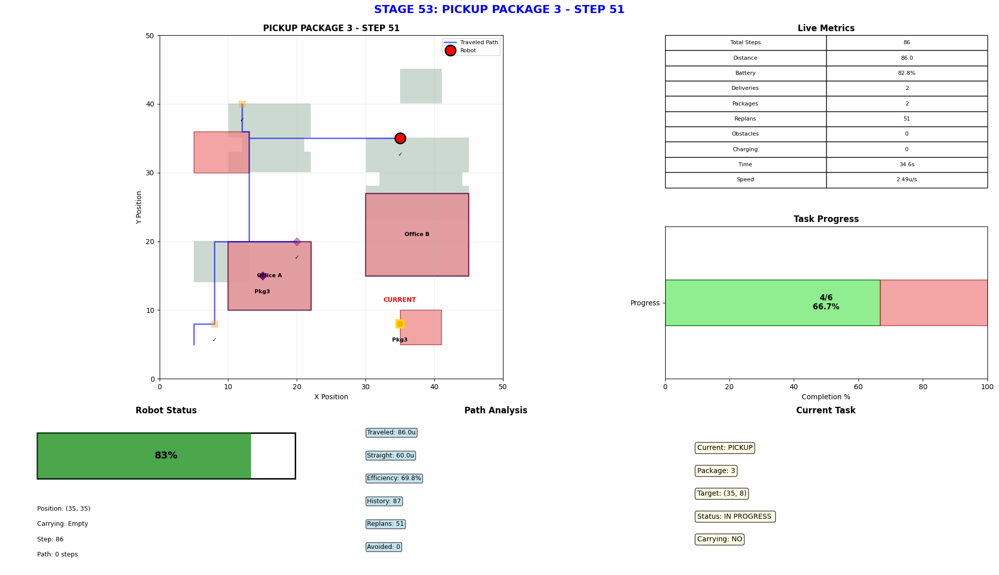

📸 Displayed: PICKUP PACKAGE 3 - STEP 51
   → Moving to (35, 8)... (Step 51, Battery: 82.8%)


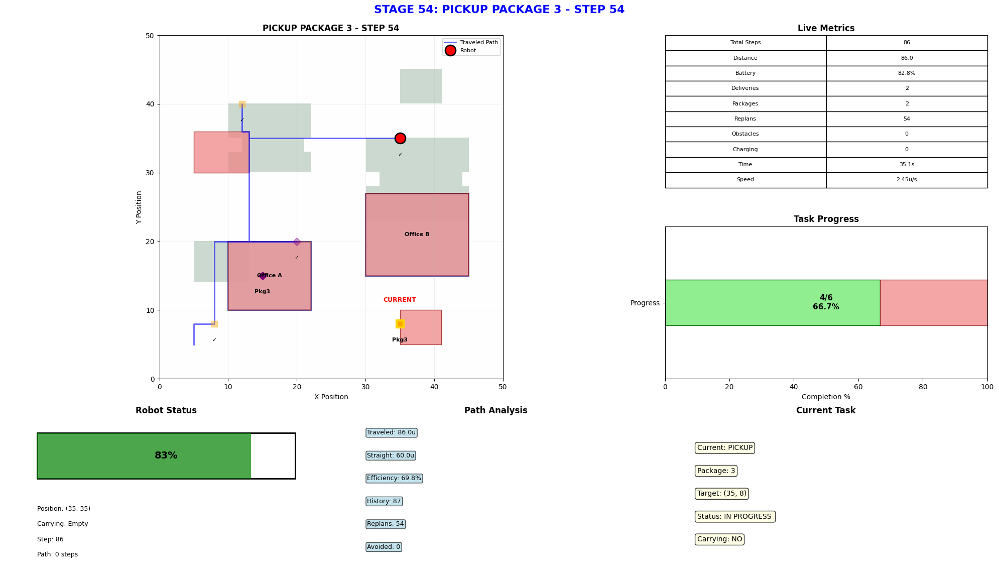

📸 Displayed: PICKUP PACKAGE 3 - STEP 54
   → Moving to (35, 8)... (Step 54, Battery: 82.8%)


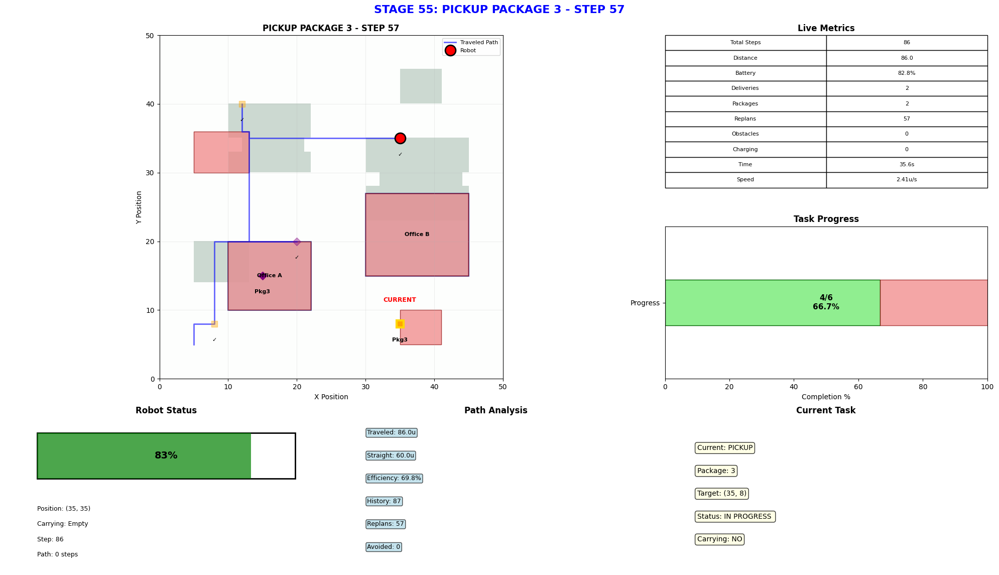

📸 Displayed: PICKUP PACKAGE 3 - STEP 57
   → Moving to (35, 8)... (Step 57, Battery: 82.8%)


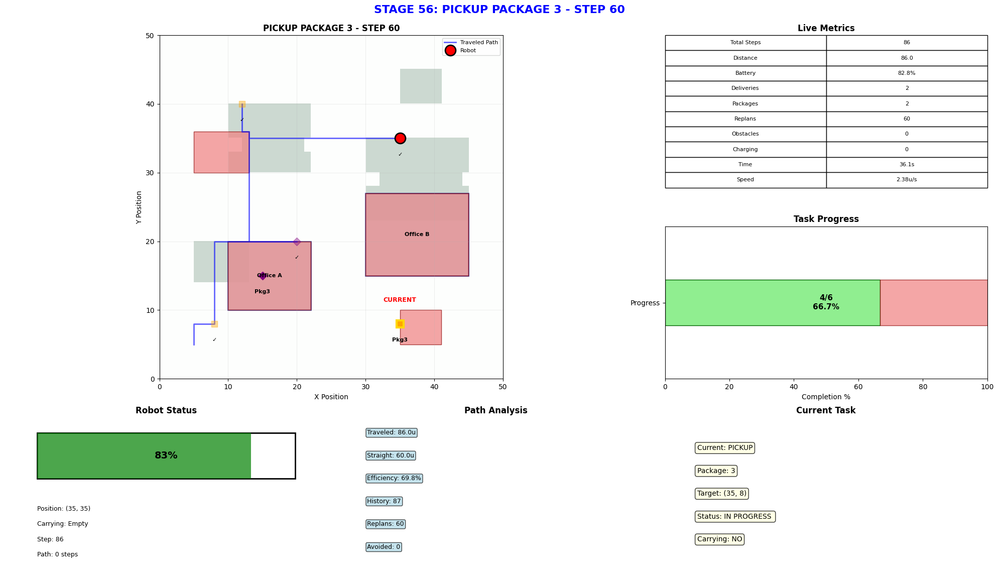

📸 Displayed: PICKUP PACKAGE 3 - STEP 60
   → Moving to (35, 8)... (Step 60, Battery: 82.8%)


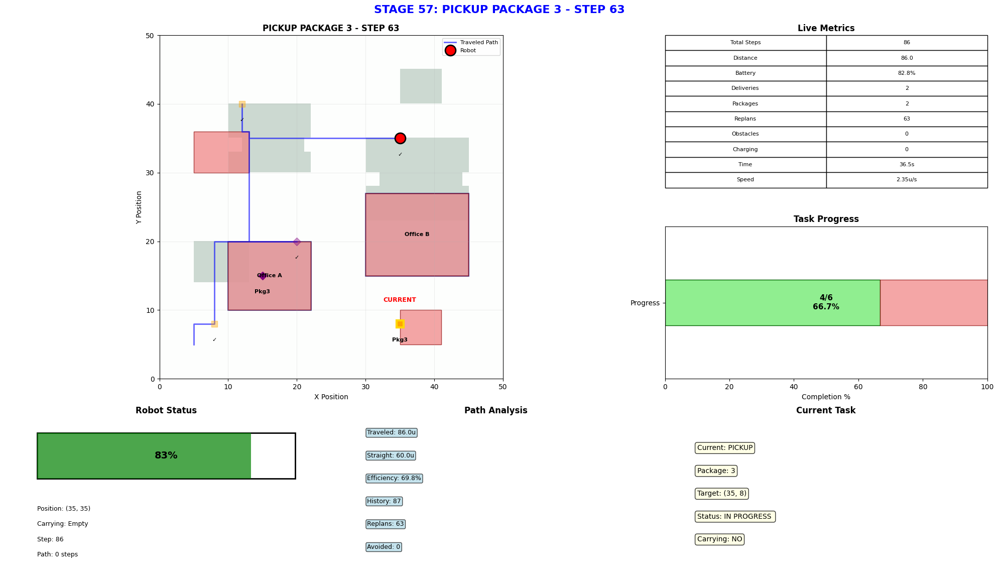

📸 Displayed: PICKUP PACKAGE 3 - STEP 63
   → Moving to (35, 8)... (Step 63, Battery: 82.8%)


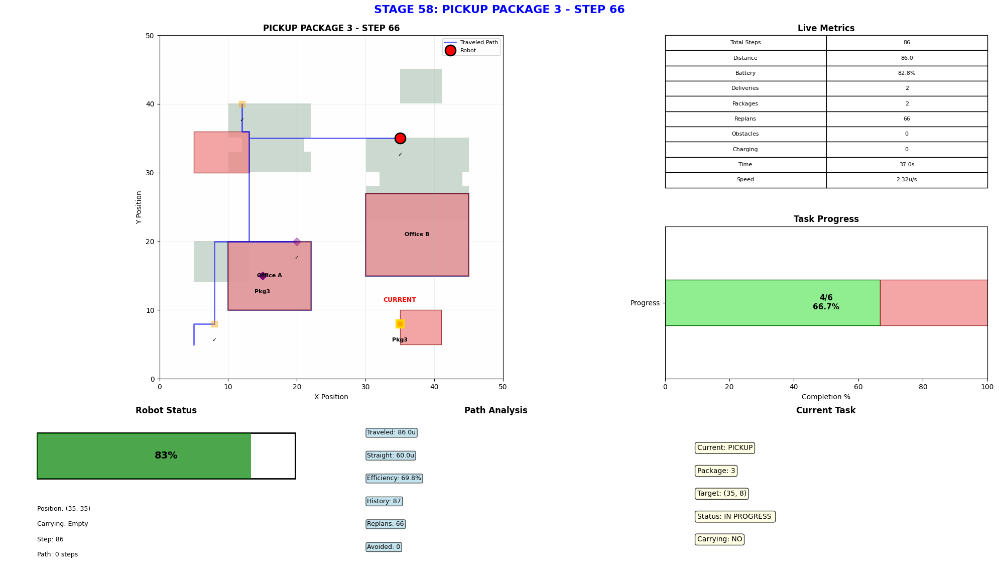

📸 Displayed: PICKUP PACKAGE 3 - STEP 66
   → Moving to (35, 8)... (Step 66, Battery: 82.8%)


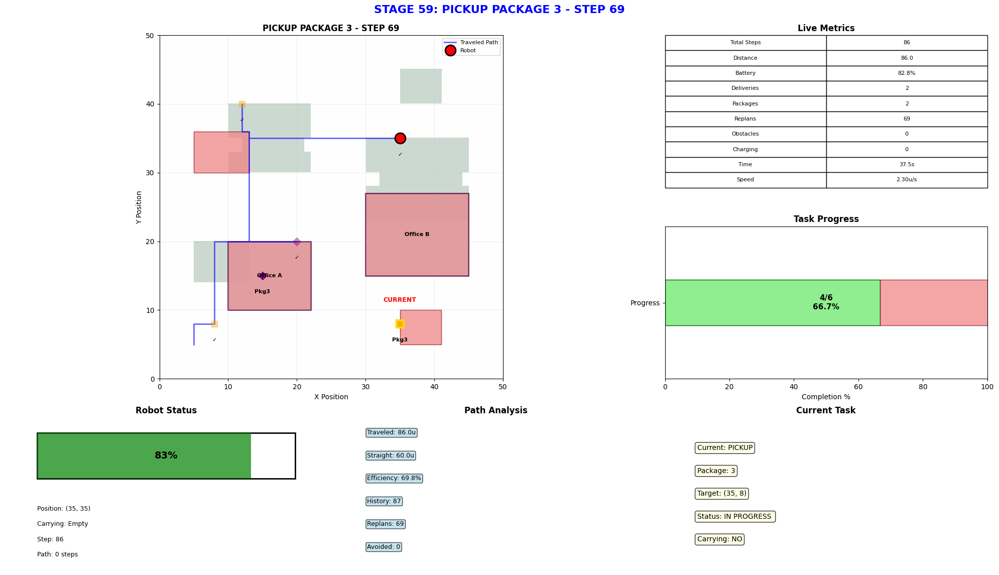

📸 Displayed: PICKUP PACKAGE 3 - STEP 69
   → Moving to (35, 8)... (Step 69, Battery: 82.8%)


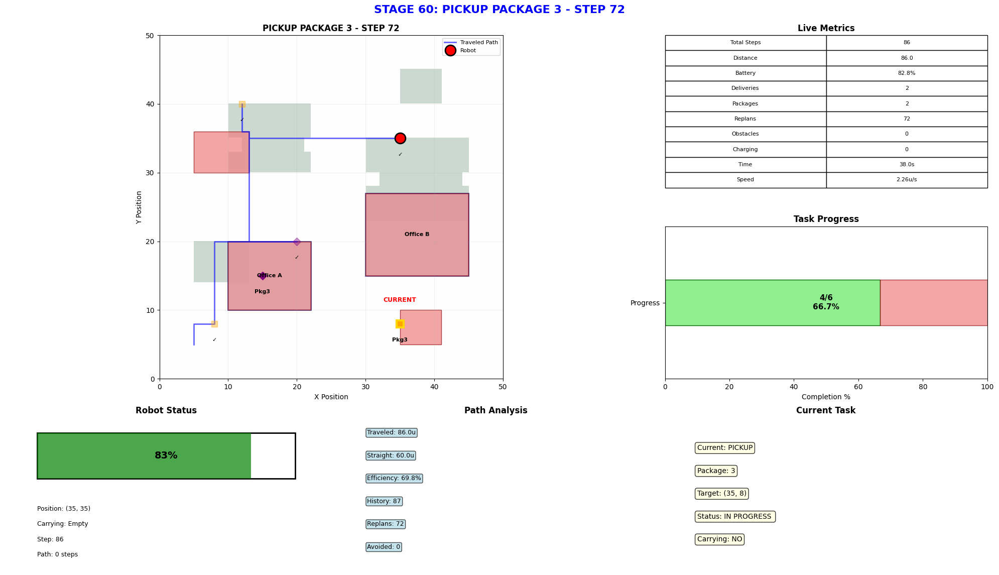

📸 Displayed: PICKUP PACKAGE 3 - STEP 72
   → Moving to (35, 8)... (Step 72, Battery: 82.8%)


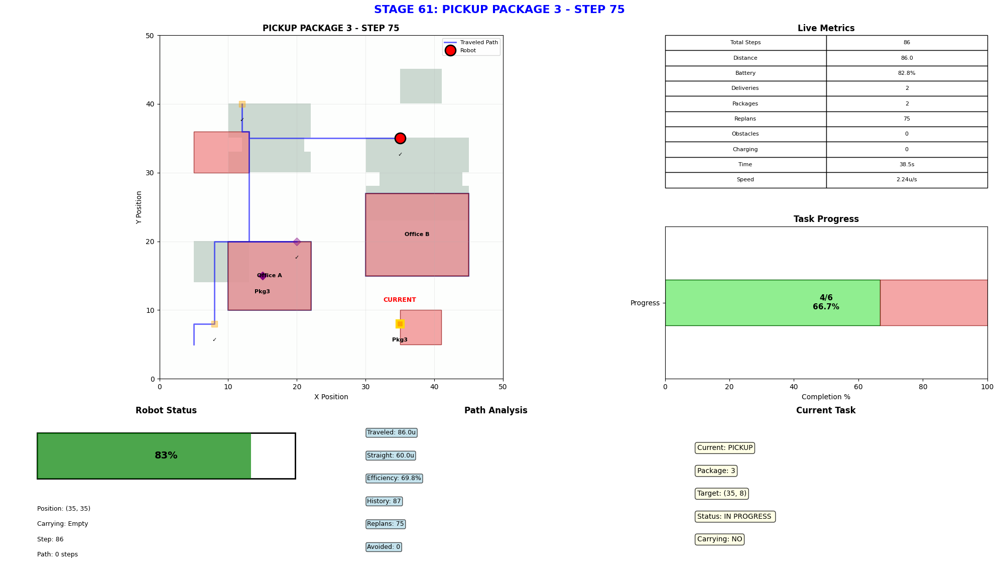

📸 Displayed: PICKUP PACKAGE 3 - STEP 75
   → Moving to (35, 8)... (Step 75, Battery: 82.8%)


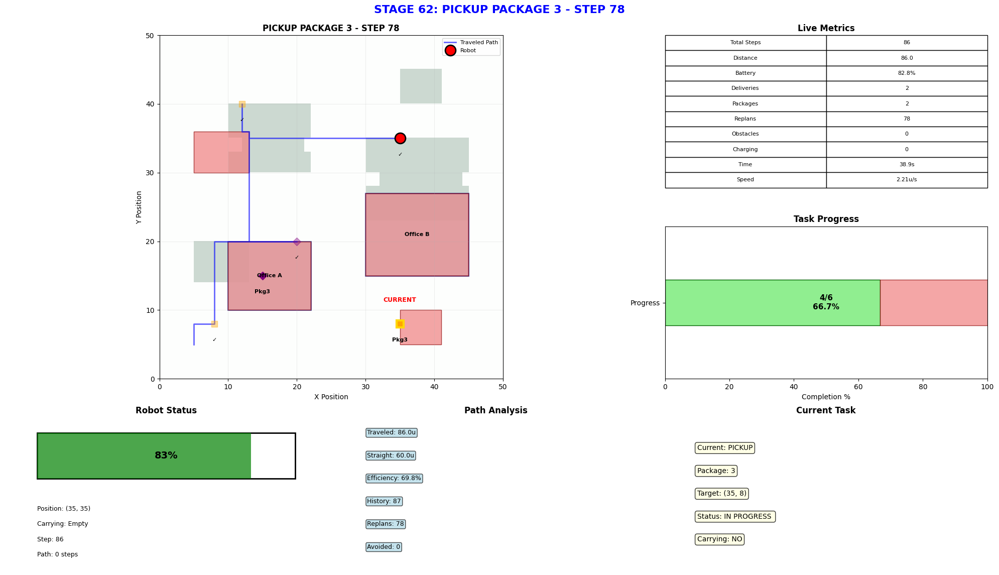

📸 Displayed: PICKUP PACKAGE 3 - STEP 78
   → Moving to (35, 8)... (Step 78, Battery: 82.8%)


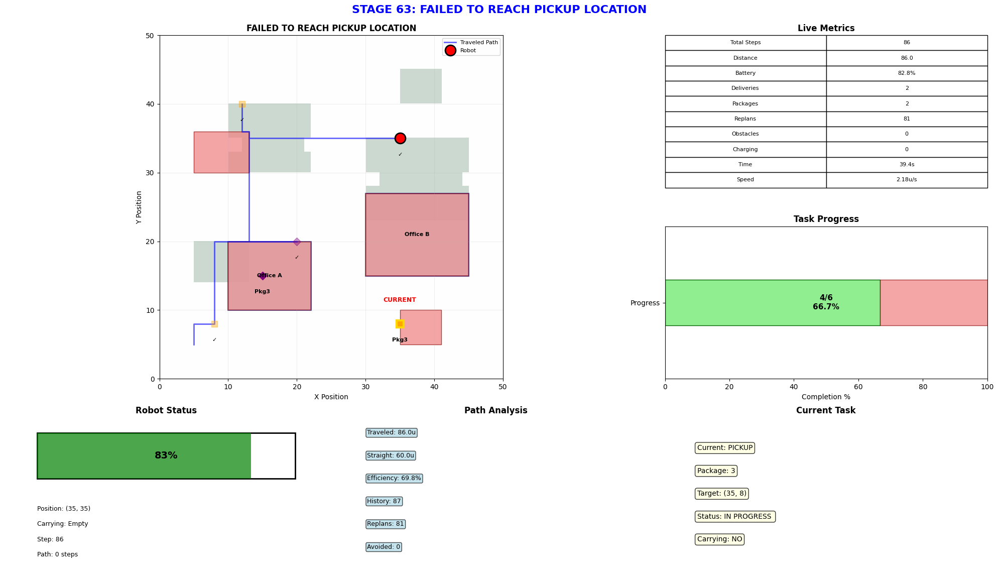

📸 Displayed: FAILED TO REACH PICKUP LOCATION
Could not reach destination after 80 attempts


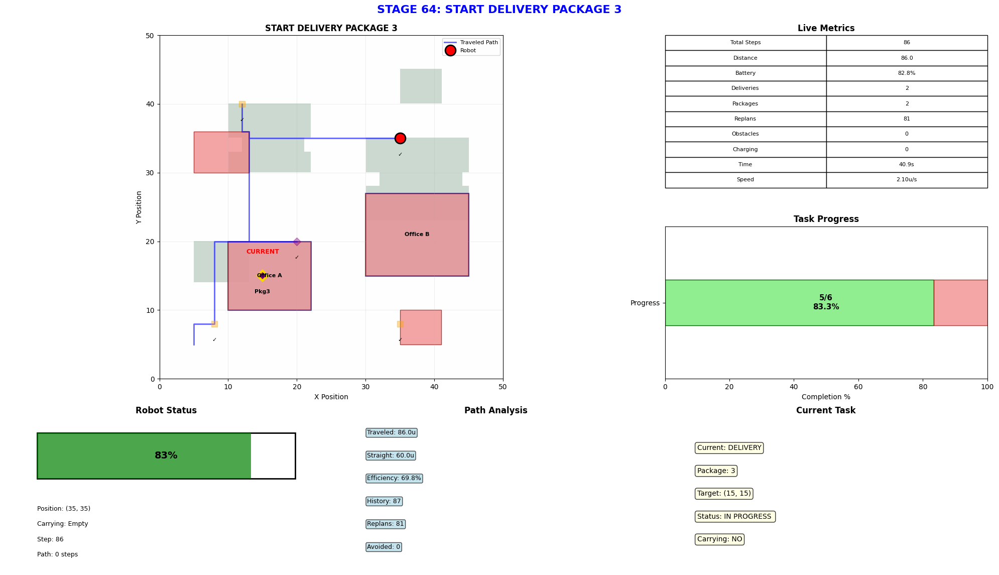

📸 Displayed: START DELIVERY PACKAGE 3


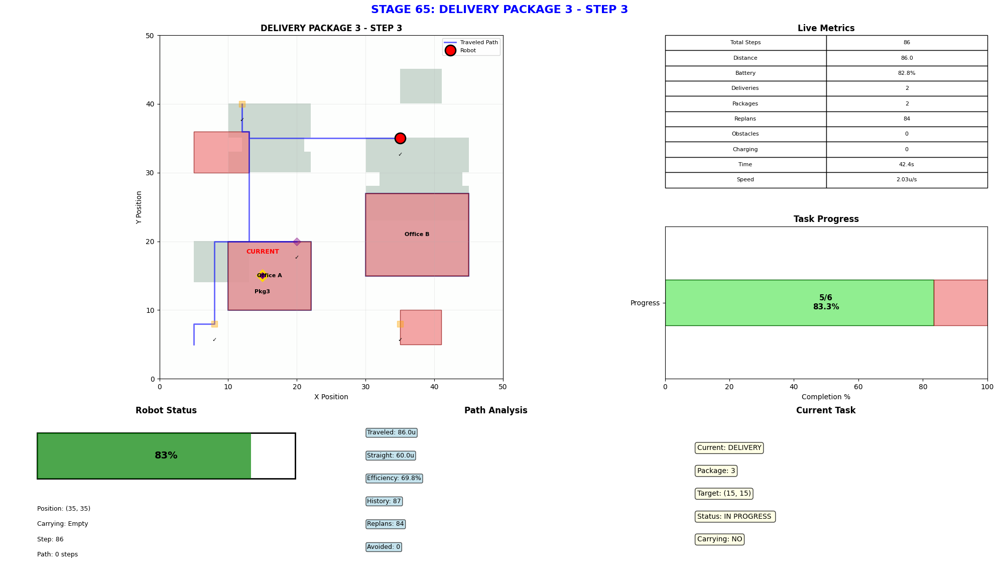

📸 Displayed: DELIVERY PACKAGE 3 - STEP 3
   → Moving to (15, 15)... (Step 3, Battery: 82.8%)


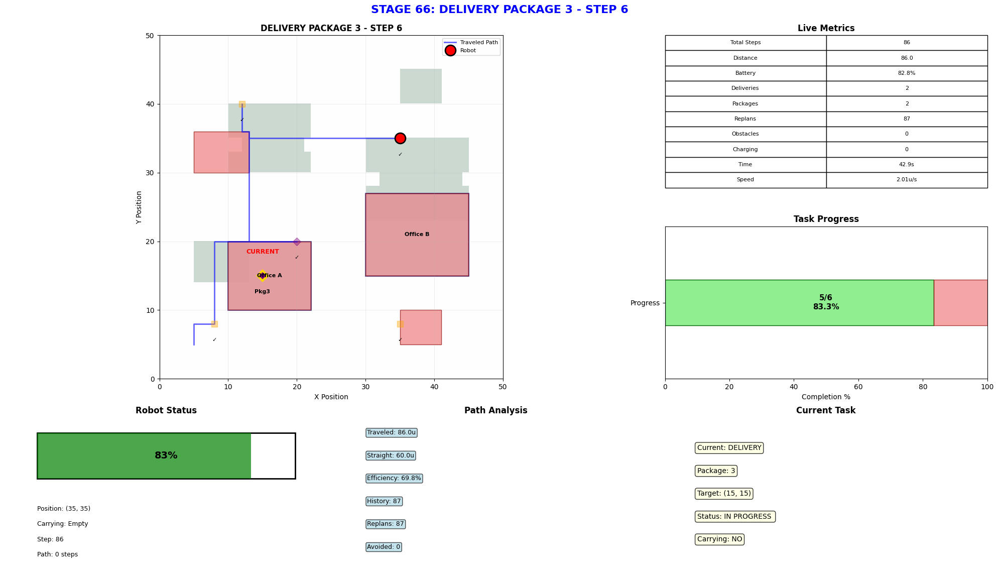

📸 Displayed: DELIVERY PACKAGE 3 - STEP 6
   → Moving to (15, 15)... (Step 6, Battery: 82.8%)


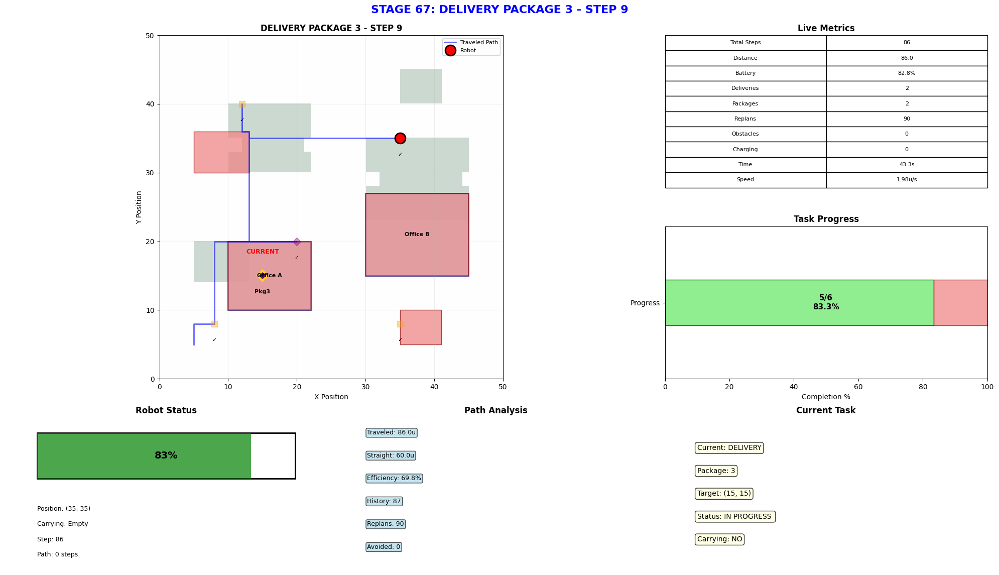

📸 Displayed: DELIVERY PACKAGE 3 - STEP 9
   → Moving to (15, 15)... (Step 9, Battery: 82.8%)


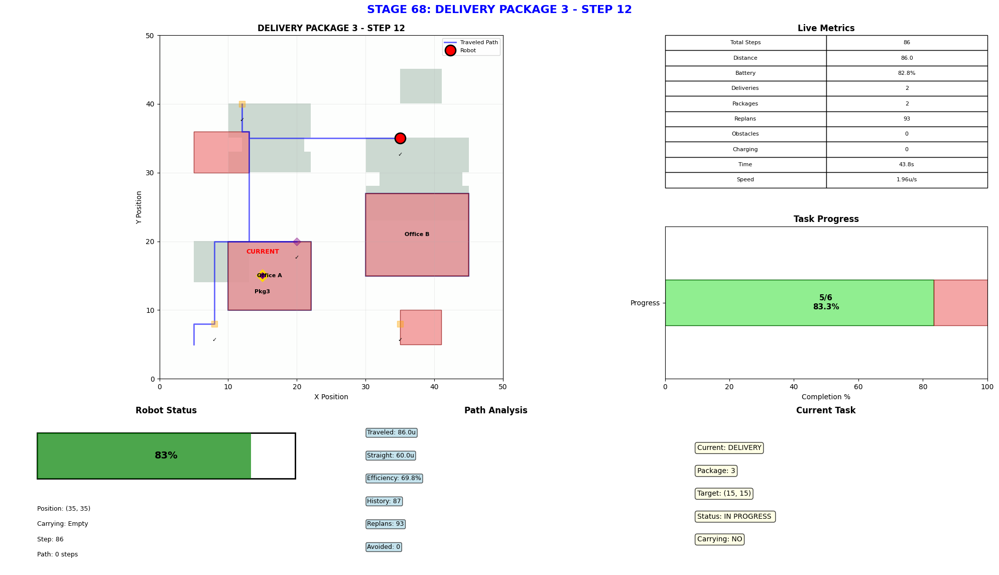

📸 Displayed: DELIVERY PACKAGE 3 - STEP 12
   → Moving to (15, 15)... (Step 12, Battery: 82.8%)


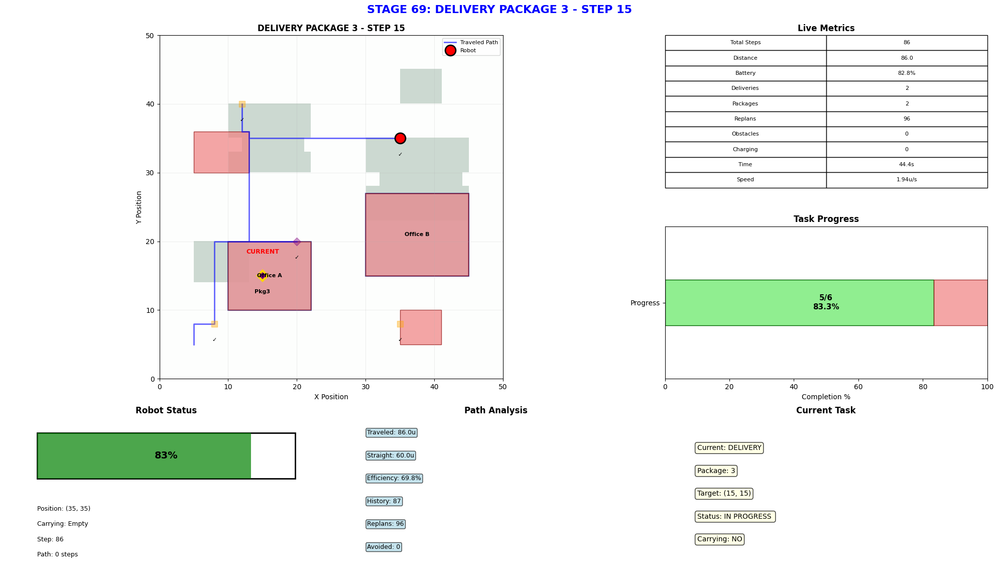

📸 Displayed: DELIVERY PACKAGE 3 - STEP 15
   → Moving to (15, 15)... (Step 15, Battery: 82.8%)


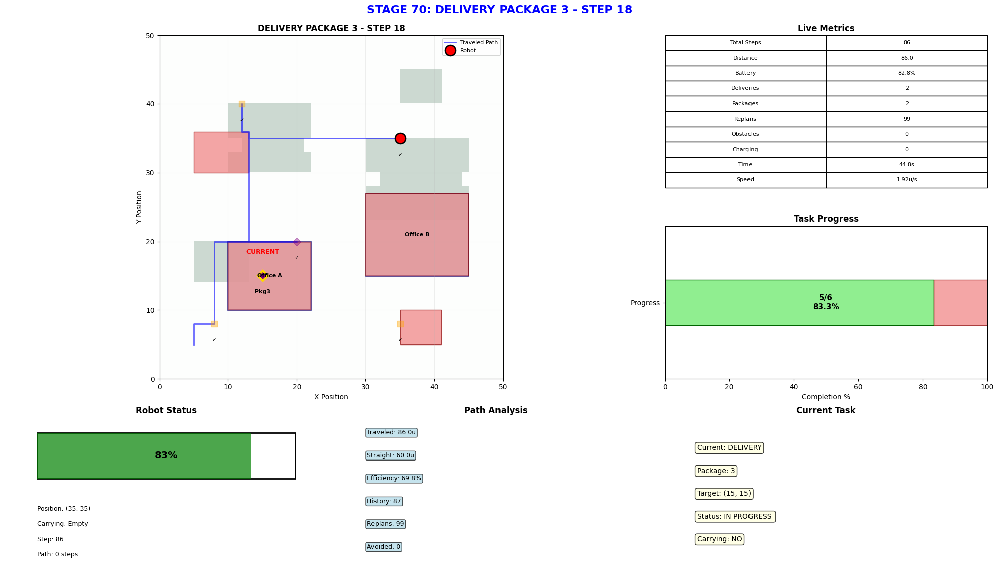

📸 Displayed: DELIVERY PACKAGE 3 - STEP 18
   → Moving to (15, 15)... (Step 18, Battery: 82.8%)


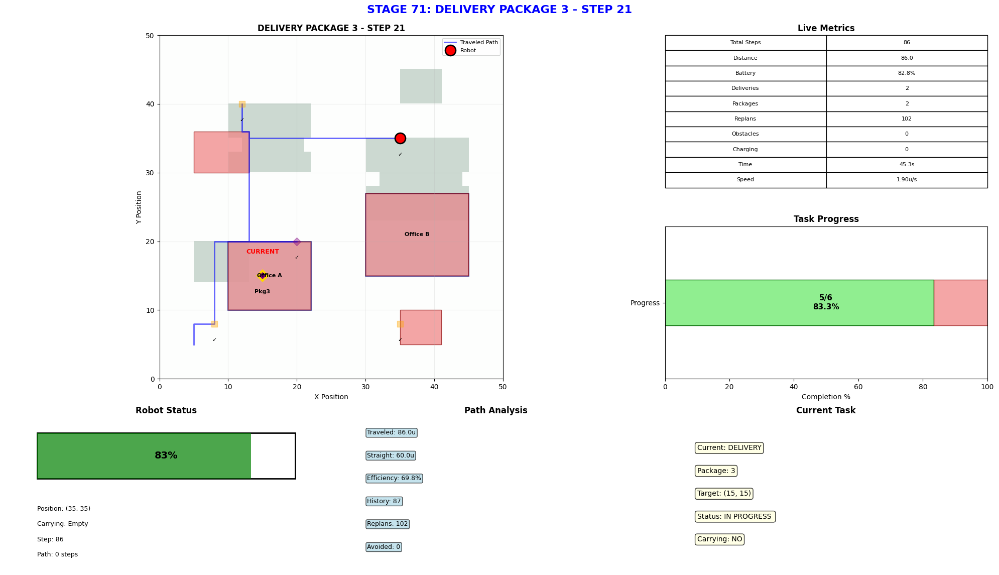

📸 Displayed: DELIVERY PACKAGE 3 - STEP 21
   → Moving to (15, 15)... (Step 21, Battery: 82.8%)


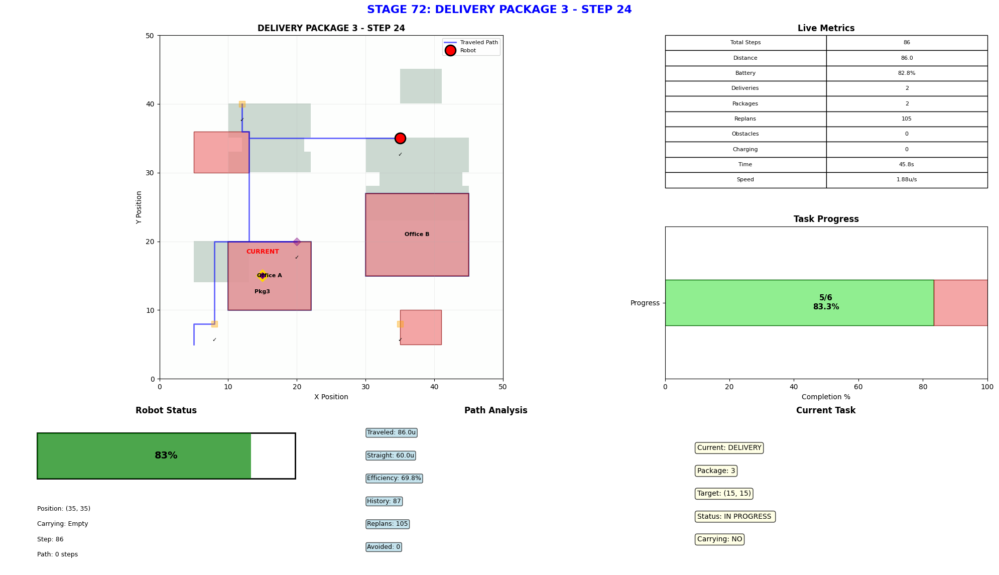

📸 Displayed: DELIVERY PACKAGE 3 - STEP 24
   → Moving to (15, 15)... (Step 24, Battery: 82.8%)


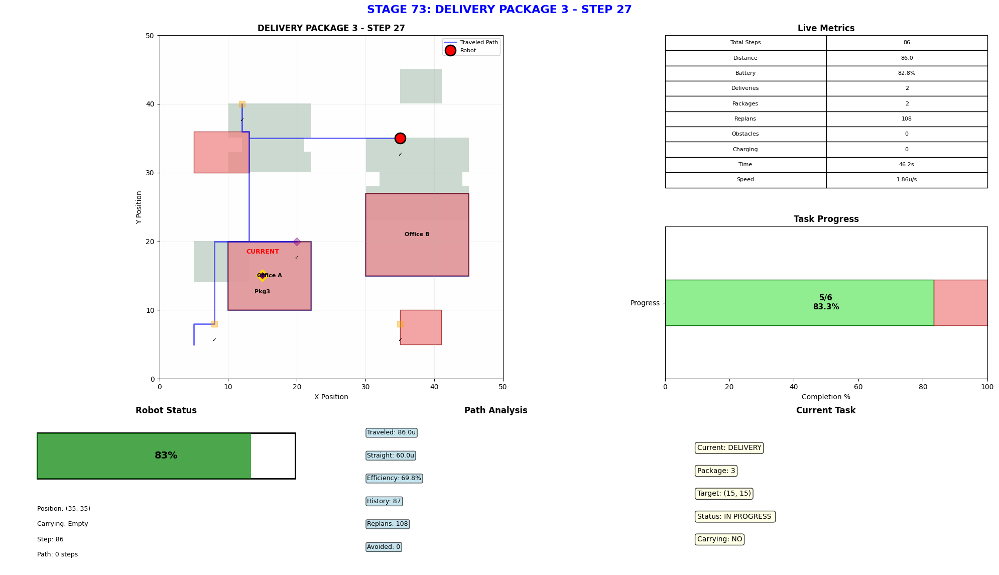

📸 Displayed: DELIVERY PACKAGE 3 - STEP 27
   → Moving to (15, 15)... (Step 27, Battery: 82.8%)


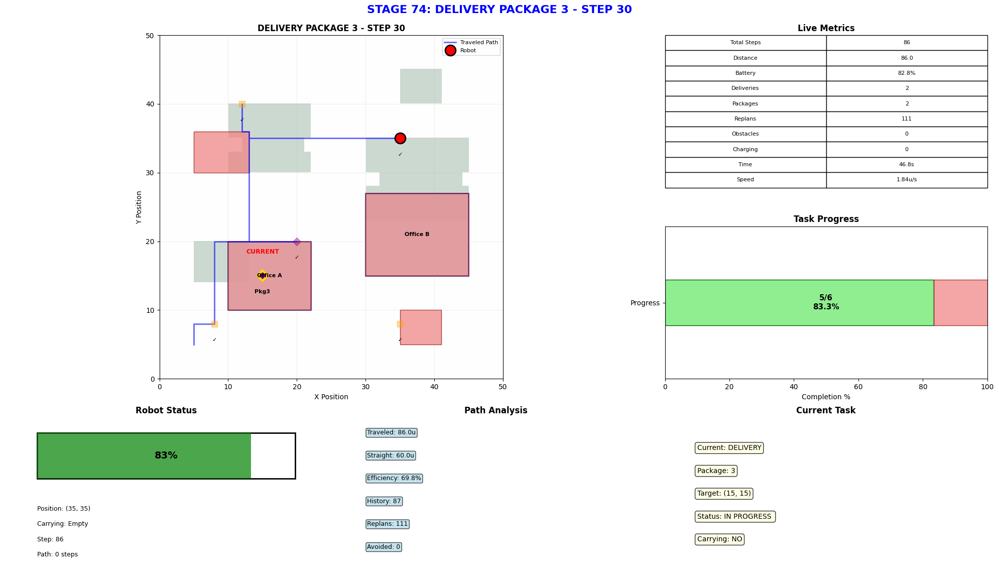

📸 Displayed: DELIVERY PACKAGE 3 - STEP 30
   → Moving to (15, 15)... (Step 30, Battery: 82.8%)


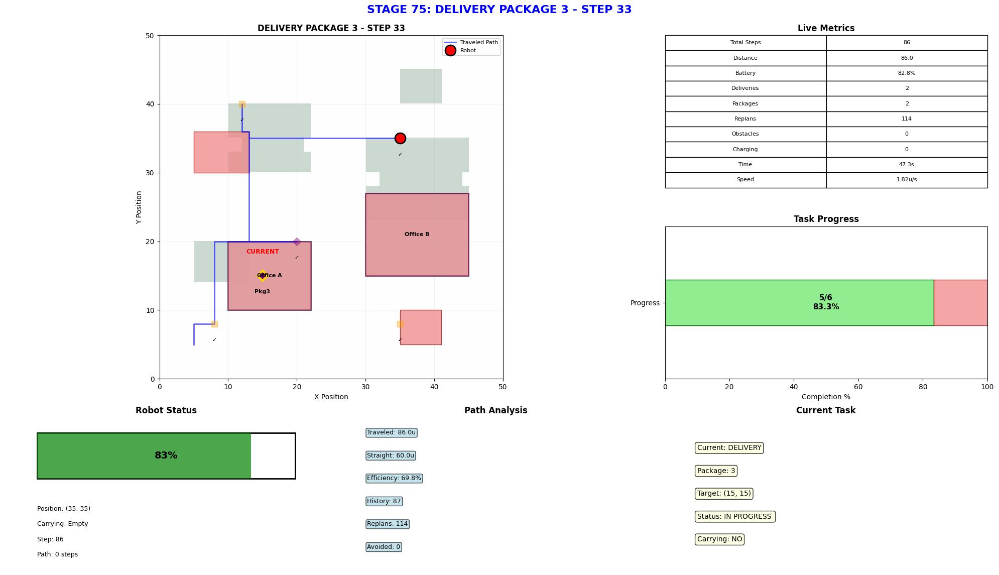

📸 Displayed: DELIVERY PACKAGE 3 - STEP 33
   → Moving to (15, 15)... (Step 33, Battery: 82.8%)


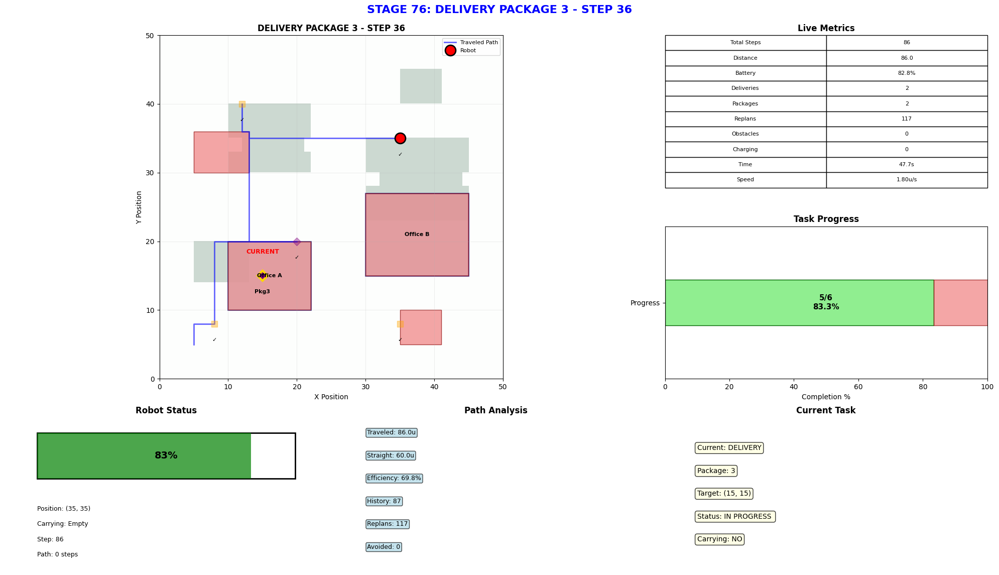

📸 Displayed: DELIVERY PACKAGE 3 - STEP 36
   → Moving to (15, 15)... (Step 36, Battery: 82.8%)


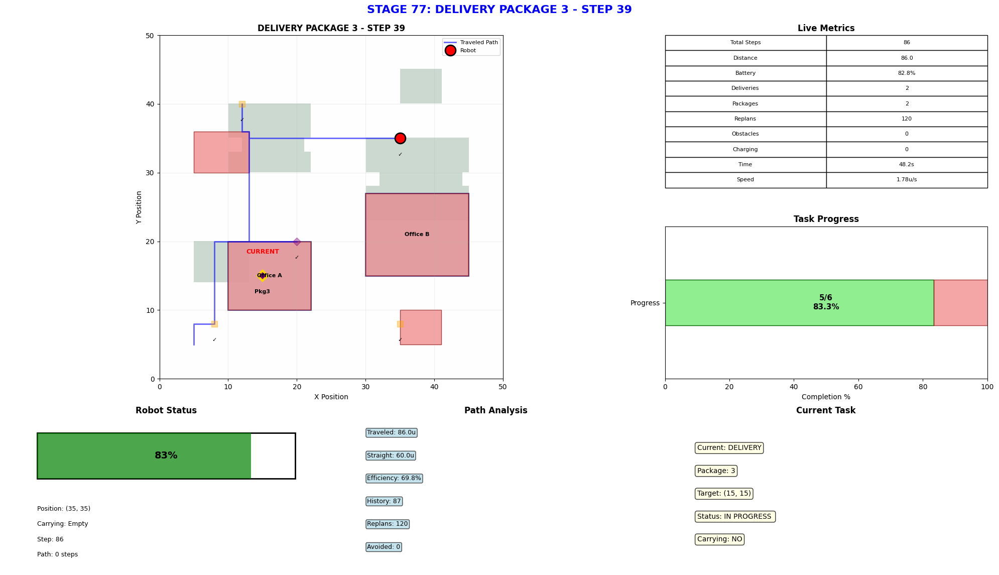

📸 Displayed: DELIVERY PACKAGE 3 - STEP 39
   → Moving to (15, 15)... (Step 39, Battery: 82.8%)


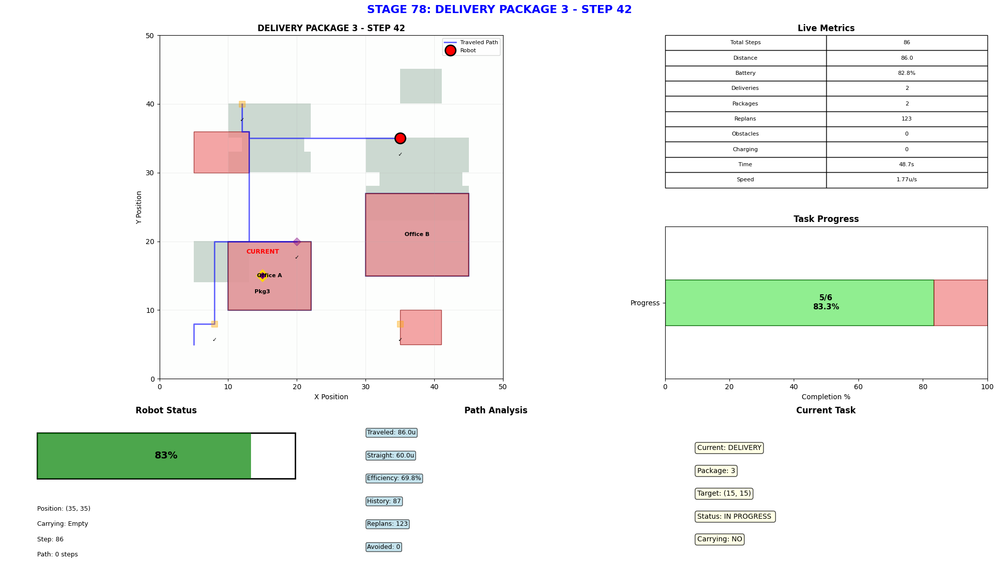

📸 Displayed: DELIVERY PACKAGE 3 - STEP 42
   → Moving to (15, 15)... (Step 42, Battery: 82.8%)


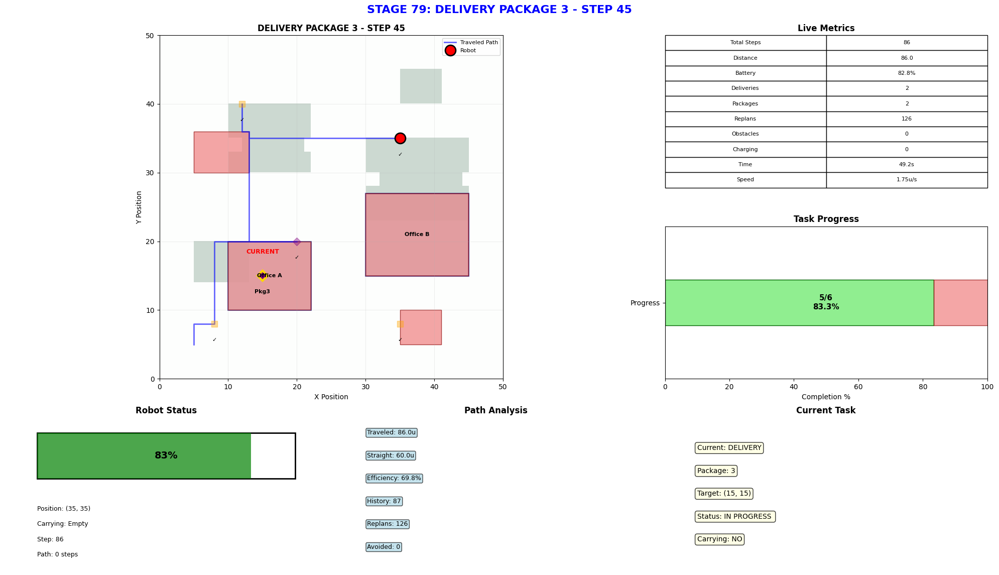

📸 Displayed: DELIVERY PACKAGE 3 - STEP 45
   → Moving to (15, 15)... (Step 45, Battery: 82.8%)


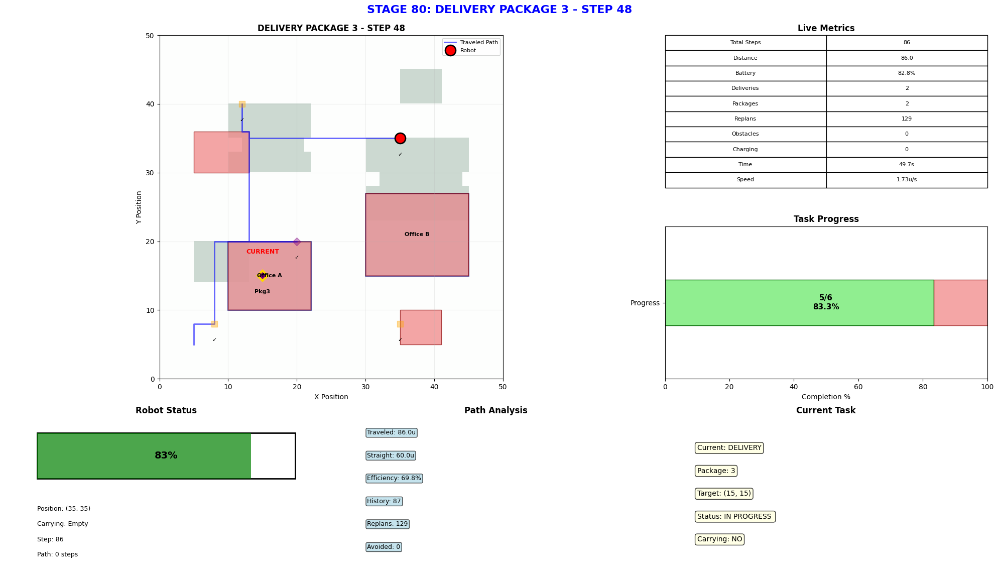

📸 Displayed: DELIVERY PACKAGE 3 - STEP 48
   → Moving to (15, 15)... (Step 48, Battery: 82.8%)


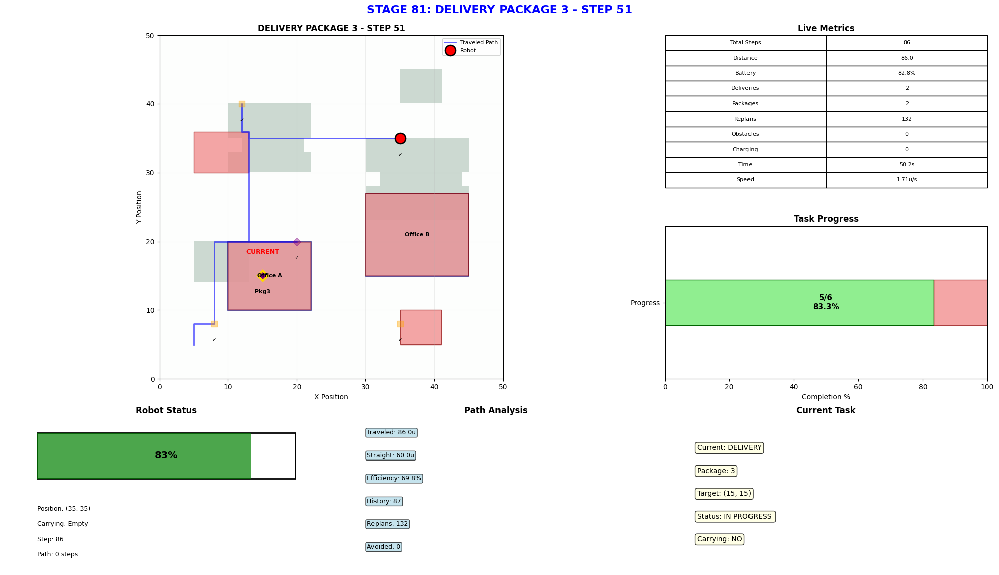

📸 Displayed: DELIVERY PACKAGE 3 - STEP 51
   → Moving to (15, 15)... (Step 51, Battery: 82.8%)


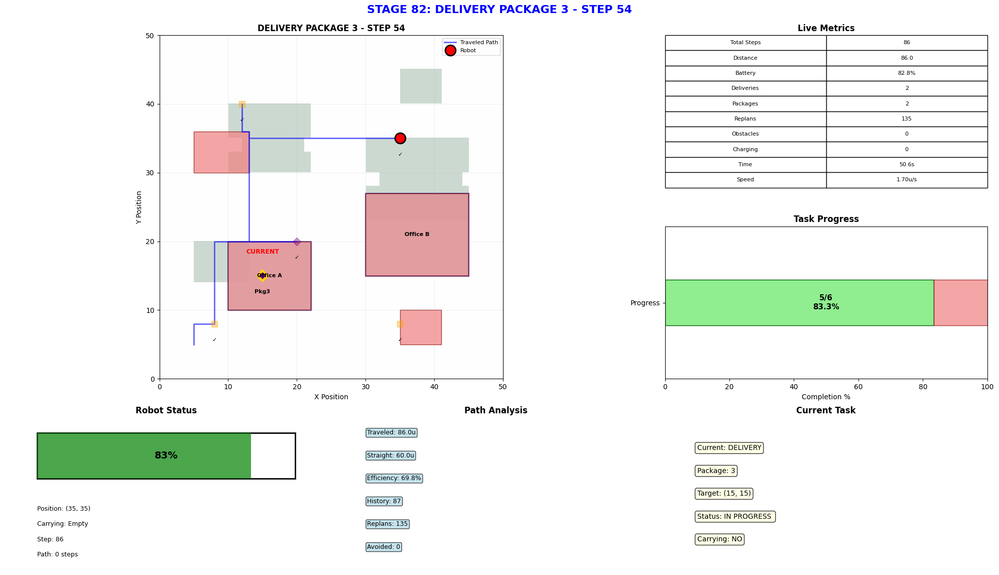

📸 Displayed: DELIVERY PACKAGE 3 - STEP 54
   → Moving to (15, 15)... (Step 54, Battery: 82.8%)


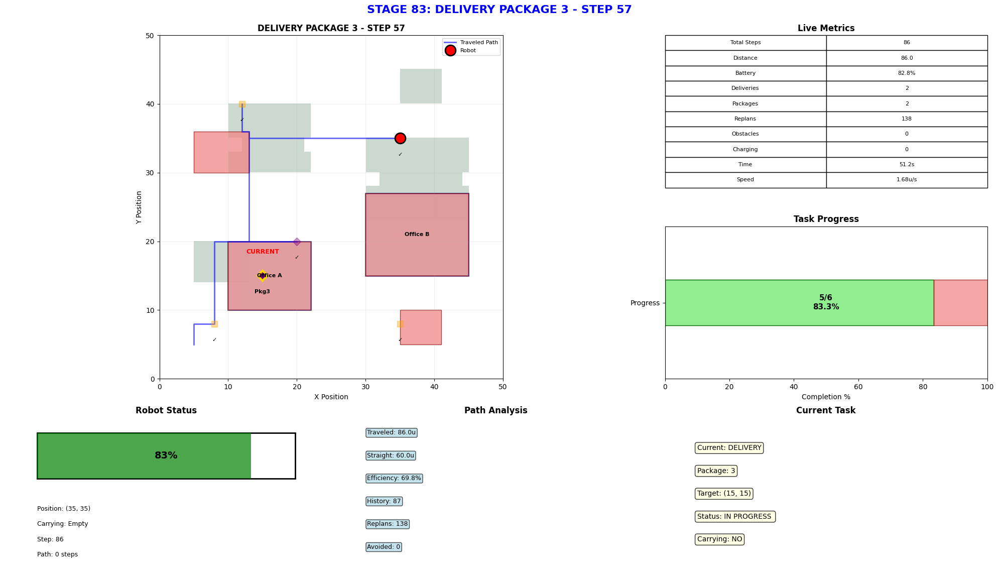

📸 Displayed: DELIVERY PACKAGE 3 - STEP 57
   → Moving to (15, 15)... (Step 57, Battery: 82.8%)


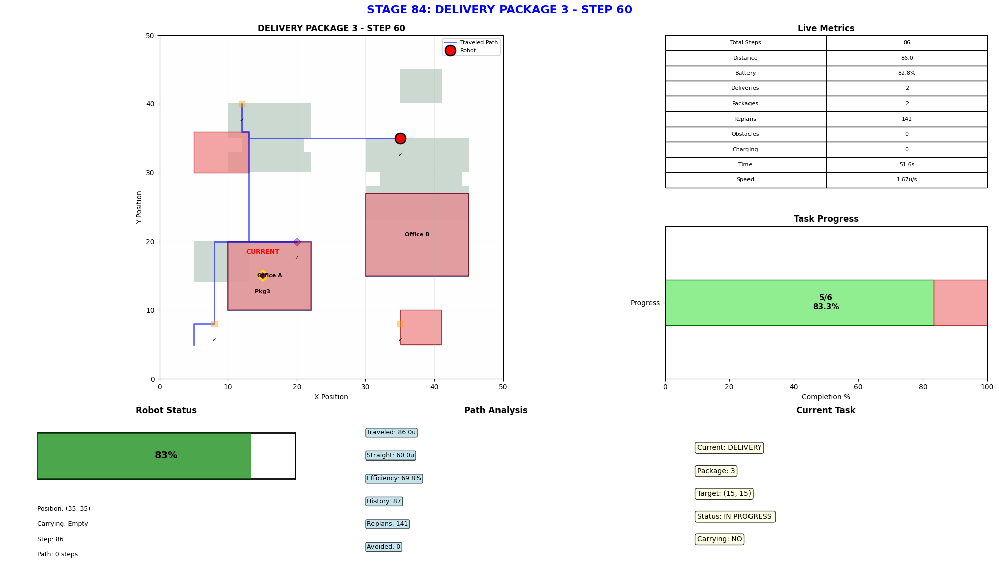

📸 Displayed: DELIVERY PACKAGE 3 - STEP 60
   → Moving to (15, 15)... (Step 60, Battery: 82.8%)


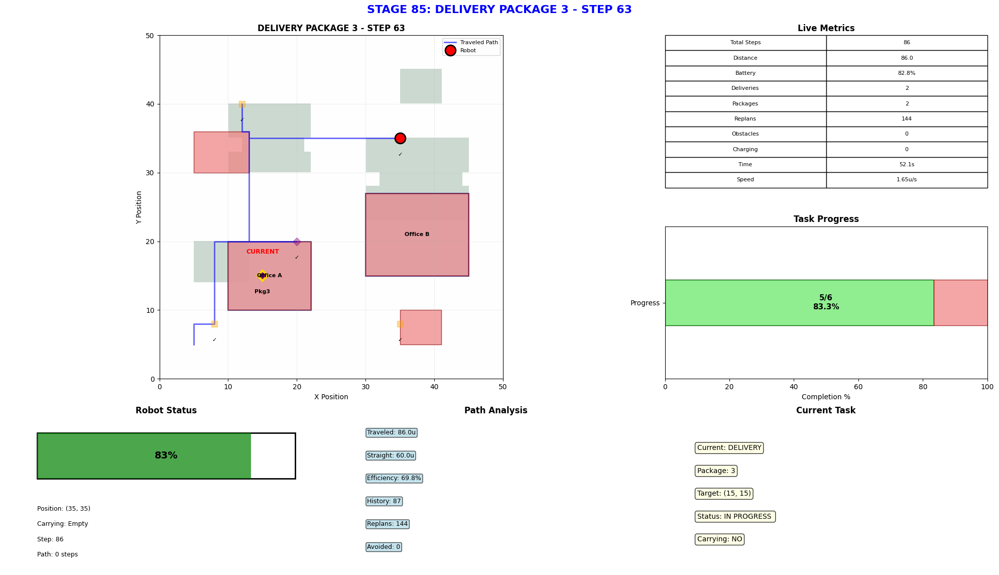

📸 Displayed: DELIVERY PACKAGE 3 - STEP 63
   → Moving to (15, 15)... (Step 63, Battery: 82.8%)


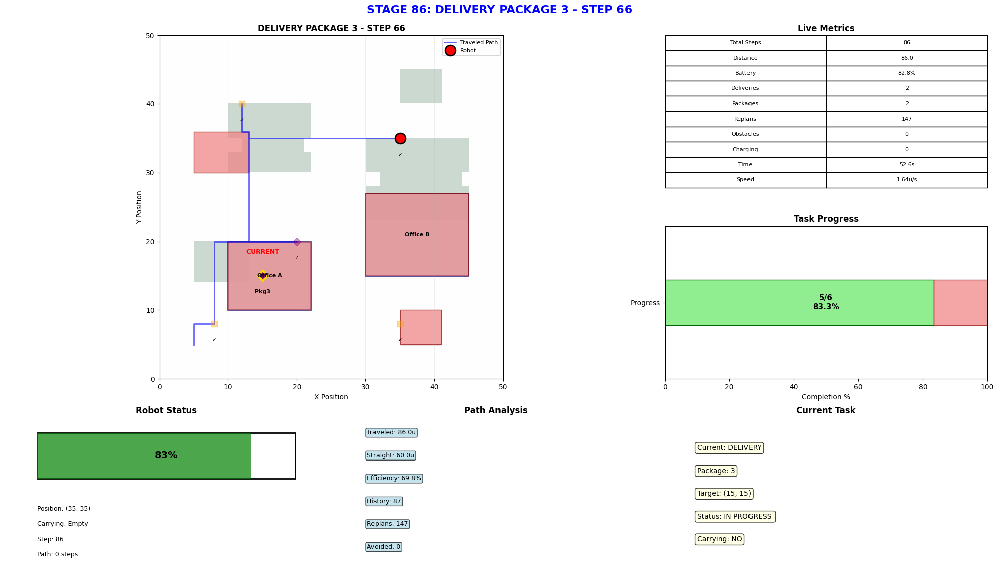

📸 Displayed: DELIVERY PACKAGE 3 - STEP 66
   → Moving to (15, 15)... (Step 66, Battery: 82.8%)


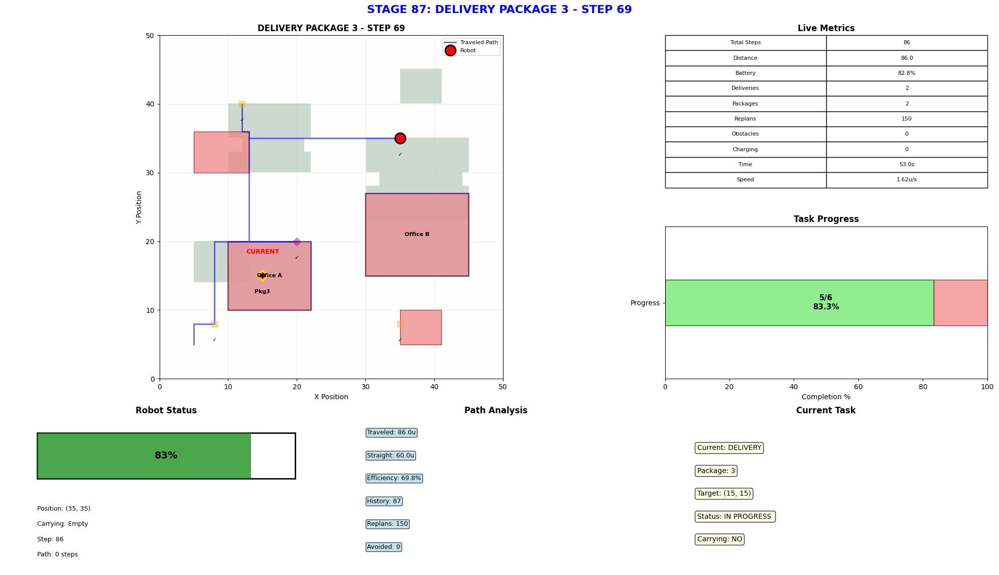

📸 Displayed: DELIVERY PACKAGE 3 - STEP 69
   → Moving to (15, 15)... (Step 69, Battery: 82.8%)


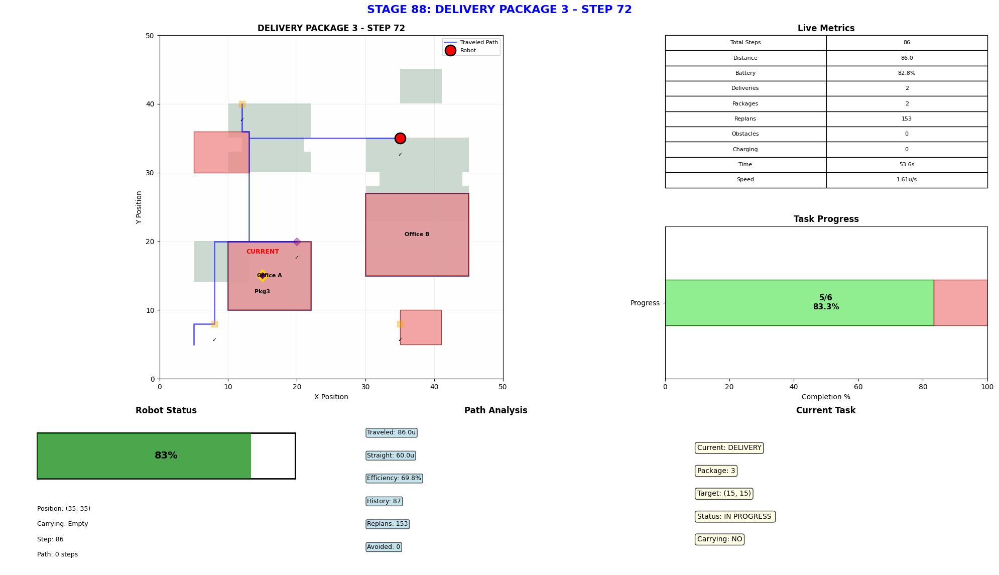

📸 Displayed: DELIVERY PACKAGE 3 - STEP 72
   → Moving to (15, 15)... (Step 72, Battery: 82.8%)


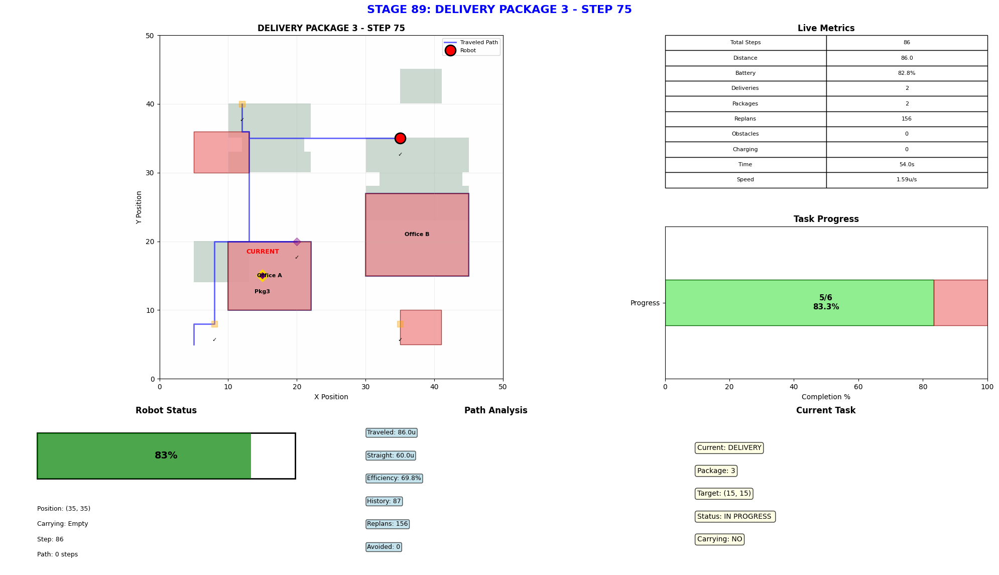

📸 Displayed: DELIVERY PACKAGE 3 - STEP 75
   → Moving to (15, 15)... (Step 75, Battery: 82.8%)


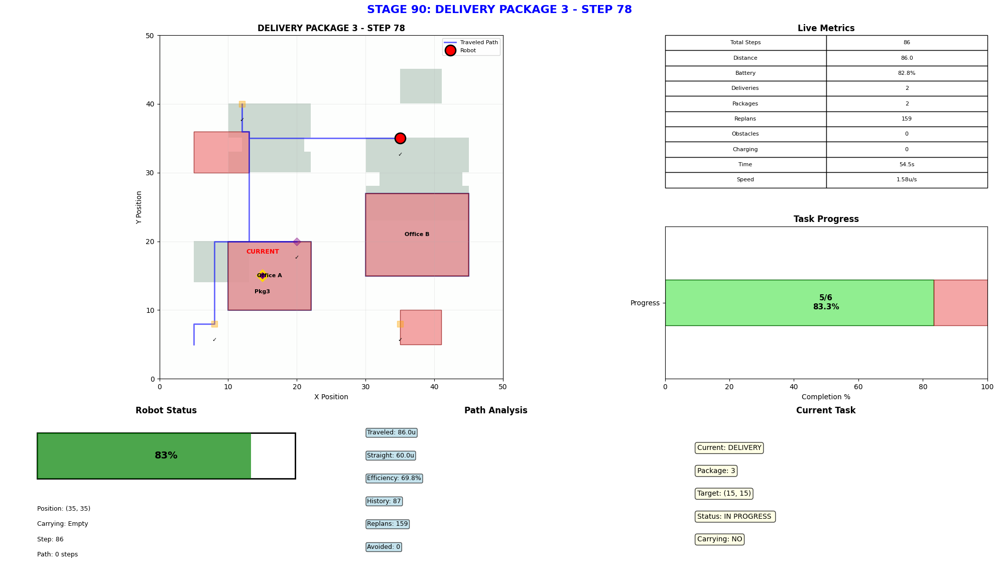

📸 Displayed: DELIVERY PACKAGE 3 - STEP 78
   → Moving to (15, 15)... (Step 78, Battery: 82.8%)


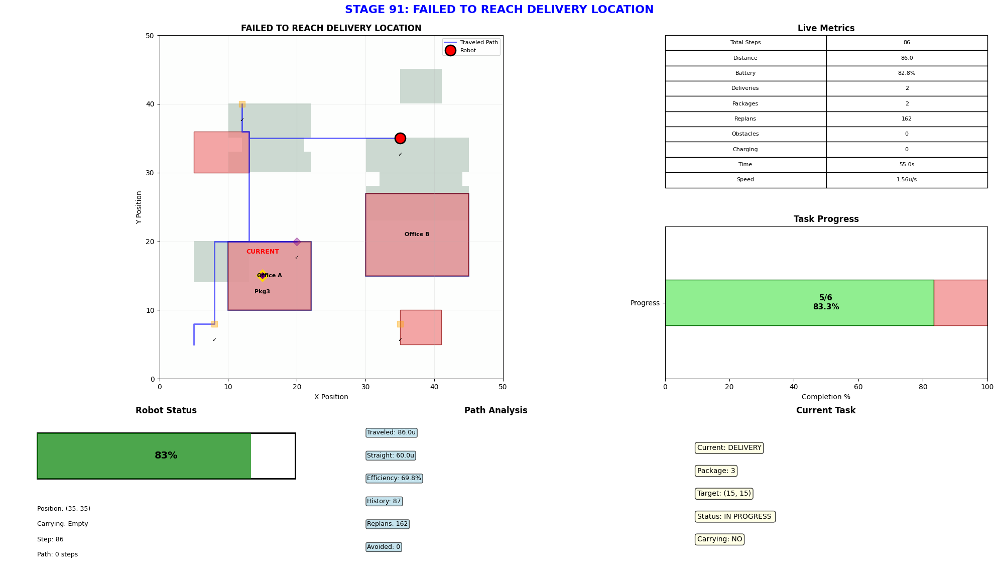

📸 Displayed: FAILED TO REACH DELIVERY LOCATION
Could not reach destination after 80 attempts


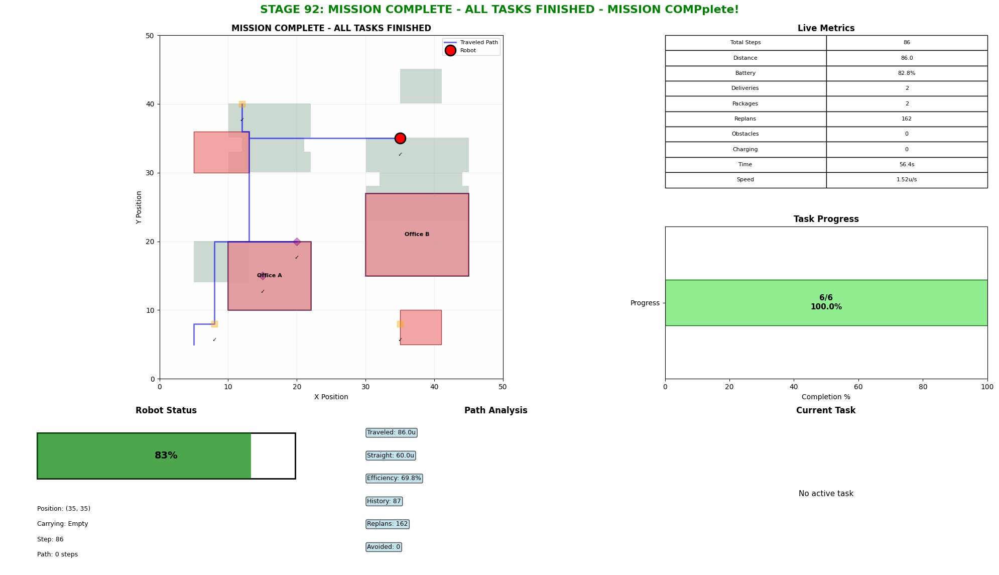

📸 Displayed: MISSION COMPLETE - ALL TASKS FINISHED

MISSION ACCOMPLISHED - FINAL REPORT
Packages Delivered: 2/3
Total Distance: 86.0 units
Total Time: 56.9 seconds
Charging Sessions: 0
Path Replans: 162
Total Stages Displayed: 92
Simulation Complete! All stages have been visualized.
Scroll up to see the complete journey from start to finish!


In [21]:
# Run the simulation
if __name__ == "__main__":
    print("Initializing Stage-by-Stage Delivery Robot Simulation...")
    sim = StageByStageSimulation()
    sim.run_simulation()